In [1]:
# Add directory above current directory to path
import sys as SYS; SYS.path.insert(0, '..')

# for saving
import os

from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt

from src import setup
# setup.use_gpu()

In [2]:
from src import ( 
    measurements as measure,
    density_matrix as DM,
    simulation as sim,
    orders,
    order_rules,
    random_unitary,
    simulation)

from Scripts import simulation_CLI as cleo

In [3]:
import matplotlib.pyplot as plt 
import matplotlib.animation as animation
# Add directory above current directory to path
import sys as SYS; SYS.path.insert(0, '../..')
import h5py
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from src import ket as ket
from src import density_matrix as DM

In [4]:
#pick={therm,inhomov1,inhomov2,pure} pick one of these to properly store images with the correct labels
dataset_label = "therm"

In [50]:
import sys as SYS; SYS.path.insert(0, '../..')
from Scripts import hdf5merge
hdf5merge.merge_hdf5_files("../data/greedy")

In [51]:
import sys as SYS; SYS.path.insert(0, '../..')
from Scripts import hdf5merge
hdf5merge.merge_hdf5_files("../data/random")

In [52]:
import sys as SYS; SYS.path.insert(0, '../..')
from Scripts import hdf5merge
hdf5merge.merge_hdf5_files("../data/landscape_maximizes")

In [53]:
import sys as SYS; SYS.path.insert(0, '../..')
from Scripts import hdf5merge
hdf5merge.merge_hdf5_files("../data/mimic")

In [5]:
newdata1 = dict(h5py.File("../data/random/random.hdf5"))
newdata2 = dict(h5py.File("../data/greedy/greedy.hdf5"))
newdata3 = dict(h5py.File("../data/mimic/mimic.hdf5"))
newdata4 = dict(h5py.File("../data/landscape_maximizes/landscape_maximizes.hdf5"))

In [6]:
def get_pops(data, n_qubits, connectivity,update_rule):
    #dimension 0 is each trial
    #dimension 1 is each time step
    #dimension 2 is each qubit
    result = []
    for trial in data[f'{n_qubits} qubits'][f'{connectivity} connectivity']['unitary energy subspace 1']:
        seed = trial.split(' ')[-1]
        dat = dict(data[f'{n_qubits} qubits'][f'{connectivity} connectivity']['unitary energy subspace 1'][f'unitary seed {seed}'][f'ordering seed {update_rule}']['pops'])
        dat = {int(k.split('(')[0]): dat[k] for k in dat}
        dat = np.array([np.array([dat[k][subkey][()] for subkey in sorted(dat[k])]) for k in sorted(dat)])
        result.append(dat)
    return(np.array(result))

def get_2_qbit_dms(data, n_qubits, connectivity,update_rule):
    basis = ket.canonical_basis(2)
    #dimension 0 is each trial
    #dimension 1 is each time step (recall that sampling step is 5 by default)
    #dimension 2 is qubit pair
    #dimension 3 and 4 is the 2 qubit density matrix
    result = []
    
    def to_tuple(string):
        tuple_elements = string.strip('()').split(',')
        return tuple(int(elem.strip()) for elem in tuple_elements)

    for trial in data[f'{n_qubits} qubits'][f'{connectivity} connectivity']['unitary energy subspace 1']:
        seed = trial.split(' ')[-1]
        dat = dict(data[f'{n_qubits} qubits'][f'{connectivity} connectivity']['unitary energy subspace 1'][f'unitary seed {seed}'][f'ordering seed {update_rule}']['two_qubit_dms'])
        dat = {int(k.split('(')[0]): dat[k] for k in dat}
        
        dat = np.array([{to_tuple(subkey):DM.DensityMatrix(dat[k][subkey],basis) for subkey in sorted(dat[k])} for k in sorted(dat)])
        result.append(dat)
    return(np.array(result))

In [9]:
num=10

In [10]:
pops_random_c2 = get_pops(newdata1, num, "c2_2local", "random")
pops_random_c4 = get_pops(newdata1, num, "c4_2local", "random")
pops_random_c5 = get_pops(newdata1, num, "c5_2local", "random")
pops_random_c6 = get_pops(newdata1, num, "c6_2local", "random")
pops_random_cn = get_pops(newdata1, num, "cN_2local", "random")

In [11]:
pops_greedy_c2 = get_pops(newdata2, num, "c2_2local", "greedy")
pops_greedy_c4 = get_pops(newdata2, num, "c4_2local", "greedy")
pops_greedy_c5 = get_pops(newdata2, num, "c5_2local", "greedy")
pops_greedy_c6 = get_pops(newdata2, num, "c6_2local", "greedy")
pops_greedy_cn = get_pops(newdata2, num, "cN_2local", "greedy")

In [12]:
pops_mimic_c2 = get_pops(newdata3, num, "c2_2local", "mimic")
pops_mimic_c4 = get_pops(newdata3, num, "c4_2local", "mimic")
pops_mimic_c5 = get_pops(newdata3, num, "c5_2local", "mimic")
pops_mimic_c6 = get_pops(newdata3, num, "c6_2local", "mimic")
pops_mimic_cn = get_pops(newdata3, num, "cN_2local", "mimic")

In [13]:
pops_landscape_maximizes_c2 = get_pops(newdata4, num, "c2_2local", "landscape_maximizes")
pops_landscape_maximizes_c4 = get_pops(newdata4, num, "c4_2local", "landscape_maximizes")
pops_landscape_maximizes_c5 = get_pops(newdata4, num, "c5_2local", "landscape_maximizes")
pops_landscape_maximizes_c6 = get_pops(newdata4, num, "c6_2local", "landscape_maximizes")
pops_landscape_maximizes_cn = get_pops(newdata4, num, "cN_2local", "landscape_maximizes")

In [14]:
#number of steps in any one evolution
steps=499
# insert the angle denominator chosen for Haar Q unitary eg pi/15 then denom =15
denom = 15 
#find the the numerical value of shift per qubit map in one trial index i.e. one full time series of evolution
def tz_two_q_dyns_map(pops_trial_index,denom): 
    tz = []
    np.array(pops_trial_index)
    for step_index in range(steps):
        tzi =  np.sin(np.pi/denom)*np.sin(np.pi/denom) -2*(pops_trial_index[step_index + 1 ] - np.cos(np.pi / denom)*np.cos(np.pi / denom)* pops_trial_index[step_index])
        tz.append(tzi)
    return tz

In [15]:
#insert num of qubits 
num_qubits = 8
#def CPcond(pops) :
 #   list_lambda_z=[]
  #  CPcond=[]
   # for size in range(num_qubits):
    #    list_lambda_z.append(np.cos(np.pi / denom) * np. cos(np.pi / denom))
    #for step in tz_two_q_dyns_map(pops,denom):
     #   abs_step = [abs(ele) for ele in step]
      #  CPcond.append(abs_step + abs(list_lambda_z))
    #return tz_two_q_dyns_map(pops)

#CPcond()
#Note if this is broke the map is not only NCP also not P
def abs_tz(pops,denom):
    abs_tz=[]
    for step in tz_two_q_dyns_map(pops,denom):
        abs_step = [abs(ele) for ele in step]
        abs_tz.append(abs_step) 
    return abs_tz
def CPcond(abs_tz_pops) :
    cp_cond=[]
    for step in abs_tz_pops:
        cp_step = [ele + np.cos(np.pi / denom) * np. cos(np.pi / denom)  for ele in step]
        cp_cond.append(cp_step) 
    return cp_cond

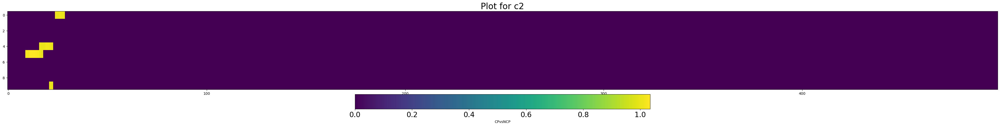

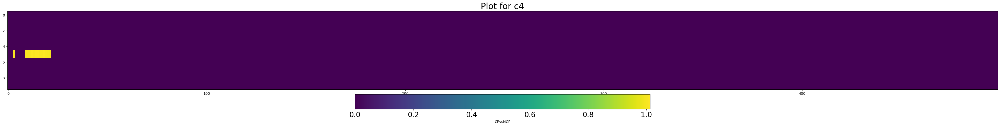

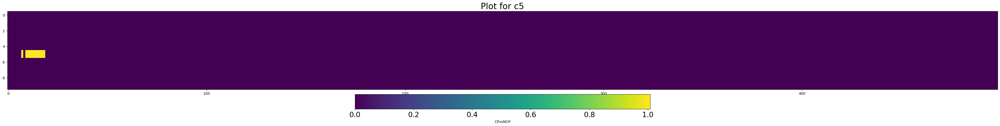

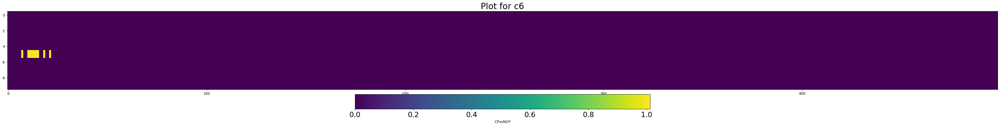

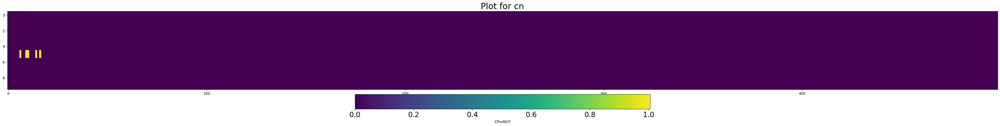

In [88]:
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_random_c2,pops_random_c4,pops_random_c5,pops_random_c6,pops_random_cn]
for pops,conn in zip(datas, dataset_names):
        es_avg = ensemble_averaged_one_point_measures_mean_std(pops)[0]
        fulllist=[]
        for timestep in CPcond(abs_tz(es_avg,denom)):
            timesteplist=[]
            for ele in timestep:
                if ele<=1:
                    ele=0
                timesteplist.append(ele)
            #print(timesteplist)
            fulllist.append(timesteplist)
        plt.figure(figsize=(50, 5))  # Adjust as necessary

        rotated_data = np.rot90(fulllist[0:499])
    # Display the rotated data
        img = plt.imshow(rotated_data, interpolation='none', aspect='auto')

    # Add a colorbar
        cbar = plt.colorbar(img, orientation='horizontal', pad=0.05)
        cbar.ax.tick_params(labelsize=20)  # Set colorbar tick label size
        cbar.set_label('CPvsNCP')
        plt.title(f'Plot for {conn}', fontsize=24)  # Optional: Add a title for clarity
        plt.savefig(f'CP_cond_on_network_{num}q_conn_{conn}_rule_R1_seed_{seed}_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
        plt.show()

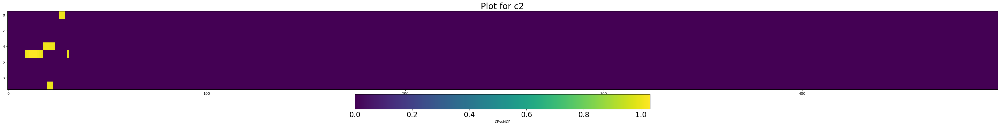

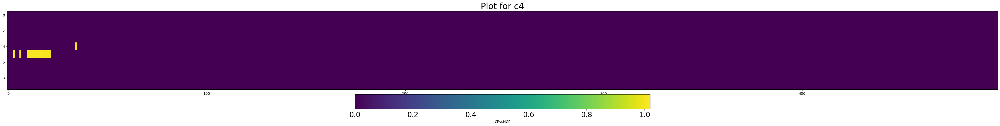

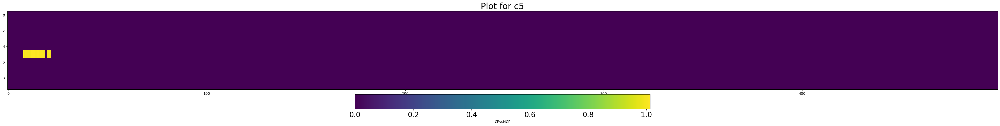

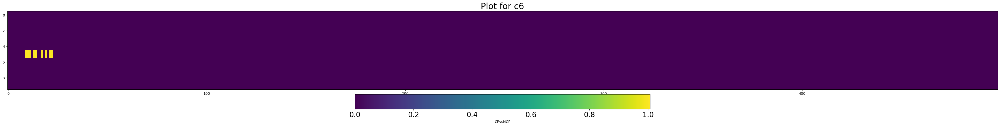

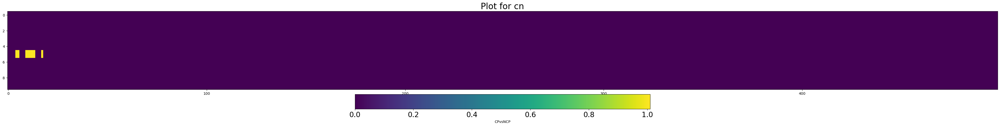

In [87]:
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_greedy_c2,pops_greedy_c4,pops_greedy_c5,pops_greedy_c6,pops_greedy_cn]
for pops,conn in zip(datas, dataset_names):
        es_avg = ensemble_averaged_one_point_measures_mean_std(pops)[0]
        fulllist=[]
        for timestep in CPcond(abs_tz(es_avg,denom)):
            timesteplist=[]
            for ele in timestep:
                if ele<=1:
                    ele=0
                timesteplist.append(ele)
            #print(timesteplist)
            fulllist.append(timesteplist)
        plt.figure(figsize=(50, 5))  # Adjust as necessary
        rotated_data = np.rot90(fulllist[0:499])
    # Display the rotated data
        img = plt.imshow(rotated_data, interpolation='none', aspect='auto')

    # Add a colorbar
        cbar = plt.colorbar(img, orientation='horizontal', pad=0.05)
        cbar.ax.tick_params(labelsize=20)  # Set colorbar tick label size
        cbar.set_label('CPvsNCP')
        plt.title(f'Plot for {conn}', fontsize=24)  # Optional: Add a title for clarity
        plt.savefig(f'CP_cond_on_network_{num}q_conn_{conn}_rule_R2_seed_{seed}_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
        plt.show()

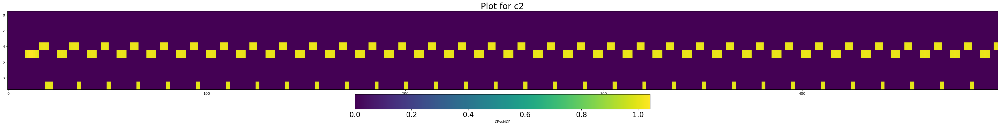

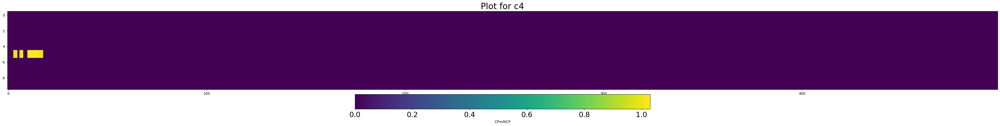

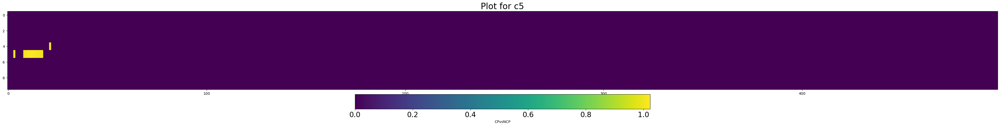

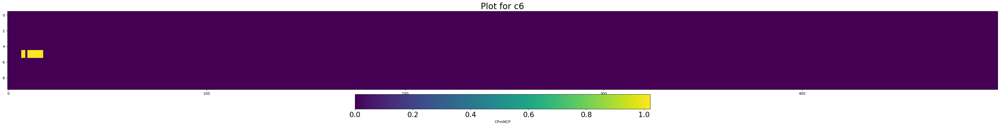

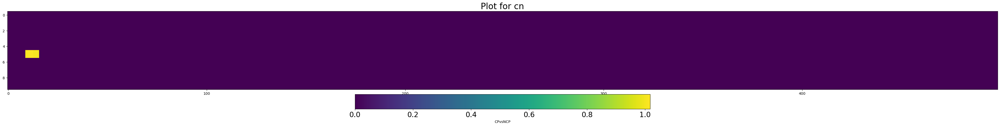

In [86]:
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_mimic_c2,pops_mimic_c4,pops_mimic_c5,pops_mimic_c6,pops_mimic_cn]
for pops,conn in zip(datas, dataset_names):
        es_avg = ensemble_averaged_one_point_measures_mean_std(pops)[0]
        fulllist=[]
        for timestep in CPcond(abs_tz(es_avg,denom)):
            timesteplist=[]
            for ele in timestep:
                if ele<=1:
                    ele=0
                timesteplist.append(ele)
            #print(timesteplist)
            fulllist.append(timesteplist)
        plt.figure(figsize=(50, 5))  # Adjust as necessary
        rotated_data = np.rot90(fulllist[0:499])
    # Display the rotated data
        img = plt.imshow(rotated_data, interpolation='none', aspect='auto')

    # Add a colorbar
        cbar = plt.colorbar(img, orientation='horizontal', pad=0.05)
        cbar.ax.tick_params(labelsize=20)  # Set colorbar tick label size
        cbar.set_label('CPvsNCP')
        plt.title(f'Plot for {conn}', fontsize=24)  # Optional: Add a title for clarity
        plt.savefig(f'CP_cond_on_network_{num}q_conn_{conn}_rule_R3_seed_{seed}_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
        plt.show()

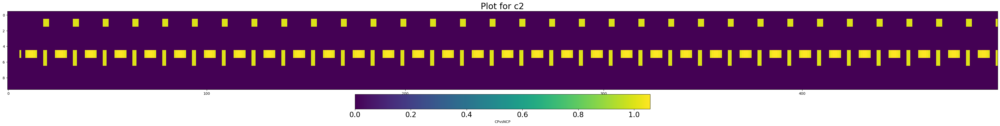

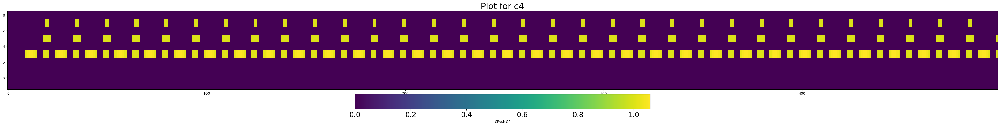

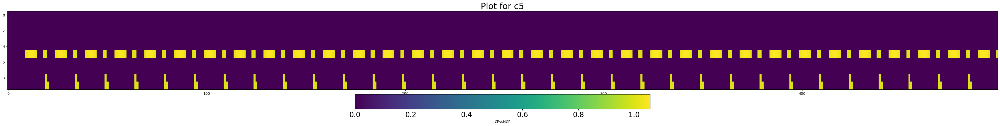

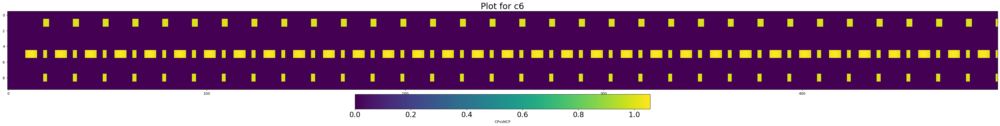

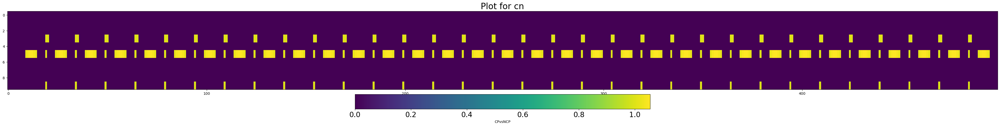

In [85]:
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_landscape_maximizes_c2,pops_landscape_maximizes_c4,pops_landscape_maximizes_c5,pops_landscape_maximizes_c6,pops_landscape_maximizes_cn]
for pops,conn in zip(datas, dataset_names):
        es_avg = ensemble_averaged_one_point_measures_mean_std(pops)[0]
        fulllist=[]
        for timestep in CPcond(abs_tz(es_avg,denom)):
            timesteplist=[]
            for ele in timestep:
                if ele<=1:
                    ele=0
                timesteplist.append(ele)
            #print(timesteplist)
            fulllist.append(timesteplist)
        plt.figure(figsize=(50, 5))  # Adjust as necessary

        rotated_data = np.rot90(fulllist[0:499])
    # Display the rotated data
        img = plt.imshow(rotated_data, interpolation='none', aspect='auto')

    # Add a colorbar
        cbar = plt.colorbar(img, orientation='horizontal', pad=0.05)
        cbar.ax.tick_params(labelsize=20)  # Set colorbar tick label size
        cbar.set_label('CPvsNCP')
        plt.title(f'Plot for {conn}', fontsize=24)  # Optional: Add a title for clarity
        plt.savefig(f'CP_cond_on_network_{num}q_conn_{conn}_rule_R4_seed_{seed}_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [16]:
def means_stds_of_tz_of_one_sim_index(tz_trial_index):
    mean_stds_list = []
    for step_index in range(steps):
        stds = np.std(tz_trial_index [step_index])
        means = np.mean(tz_trial_index[step_index])
        mean_stds_list.append([means, stds])
    return mean_stds_list

def means_stds_mode_of_tz_of_one_sim_index(tz_trial_index):
    mean_stds_mode_list = []
    for step_index in range(steps):
        total = sum(tz_trial_index[step_index])
        stds = np.std(tz_trial_index[step_index])
        means = np.mean(tz_trial_index[step_index])
        mode = max(tz_trial_index[step_index])
        mean_stds_mode_list.append([total,stds,means,mode])
    return mean_stds_mode_list

def extract_total(list_of_lists):
    return [sublist[0] for sublist in list_of_lists]
def extract_stds(list_of_lists):
    return [sublist[1] for sublist in list_of_lists]
def extract_means(list_of_lists):
    return [sublist[2] for sublist in list_of_lists]
def extract_mode(list_of_lists):
    return [sublist[3] for sublist in list_of_lists]

In [17]:
def ensemble_averaged_one_point_measures_mean_std(datasets):
    # Assuming datasets is a list of 100 datasets, where each dataset is a 2D array of shape (100, N)
    # Stack datasets into a 3D array
    stacked_data = np.stack(datasets)  # Shape (100, 100, N)

    # Take the ensemble average along the first axis (averaging over all datasets)
    ensemble_average = np.mean(stacked_data, axis=0)  # Shape (100, N)

    # Calculate the standard deviation along the first axis
    ensemble_std = np.std(stacked_data, axis=0) 
    return (ensemble_average, ensemble_std)

def time_averaged_one_point_measures_at_t(dataset,t):
    # Assuming dataset is list of 100 lists i.e. one trial
    #stack datasets in 3D
    # Take the ensemble average along the first axis (averaging over all datasets)
    sum_till_t = np.sum(dataset[:t], axis=0)
    time_average_t = (1/(t+1))*(sum_till_t)
    return (time_average_t)

def time_averaged_one_point_measures_matrix_full_sim(dataset):
    # Take the ensemble average along the first axis (averaging over all datasets)
    time_average=[]
    for t in range(len(dataset)):
        time_average.append(time_averaged_one_point_measures_at_t(dataset,t))
    return (time_average)
    

In [18]:
ytherm8= (7*0.1 + 0.4)/8
ytherm10=(9*0.1 + 0.4)/10
ytherm12=(11*0.1 + 0.4)/12
ytherm14=(13*0.1 + 0.4)/14

ypure8=(7*0 + 1)/8
ypure10=(9*0 + 1)/10
ypure12=(11*0 + 1)/12
ypure14=(13*0 + 1)/14

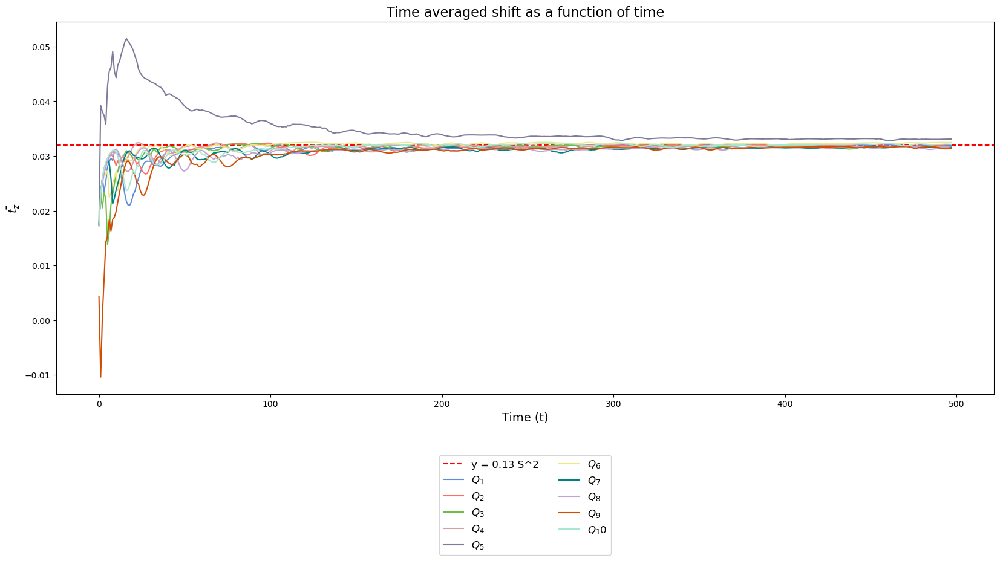

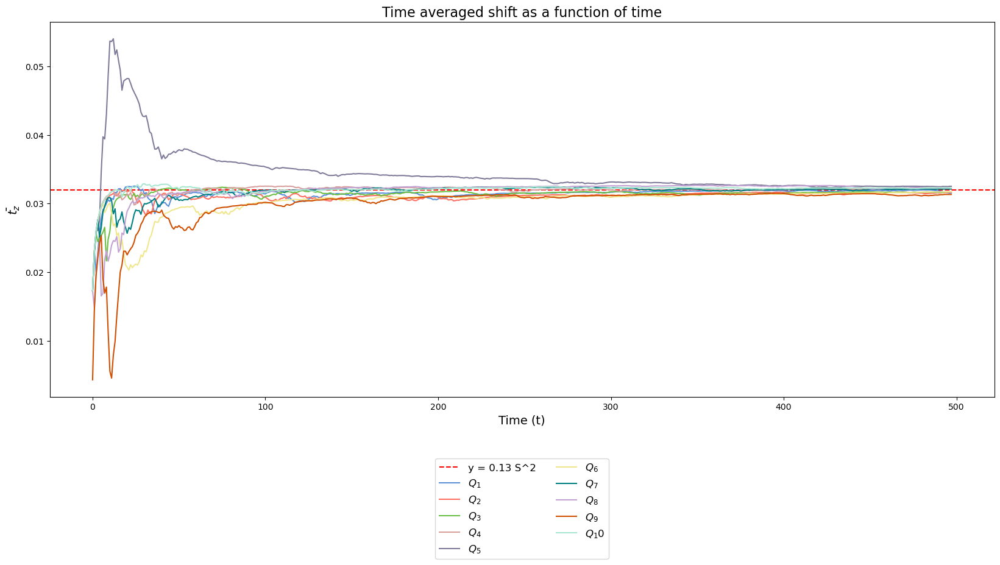

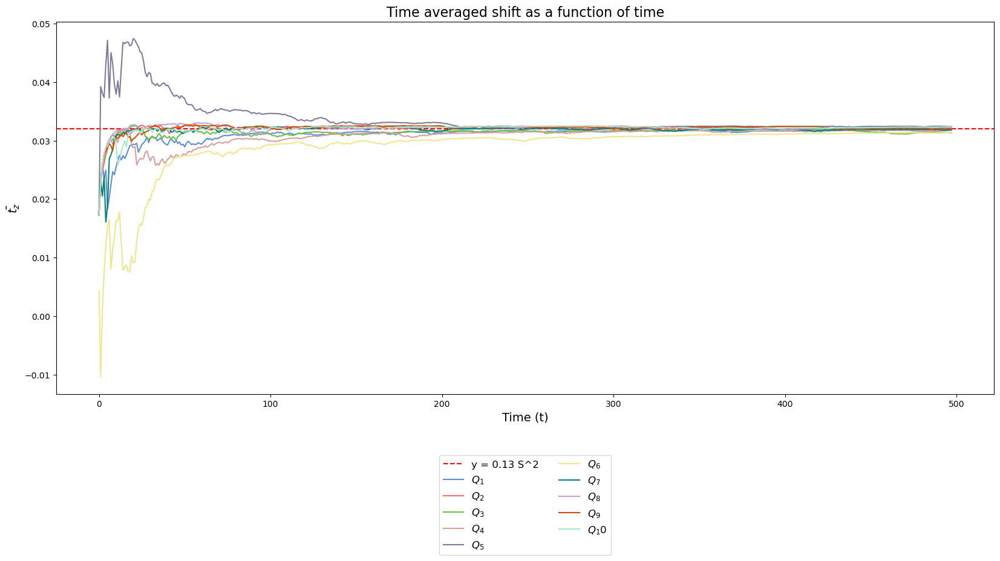

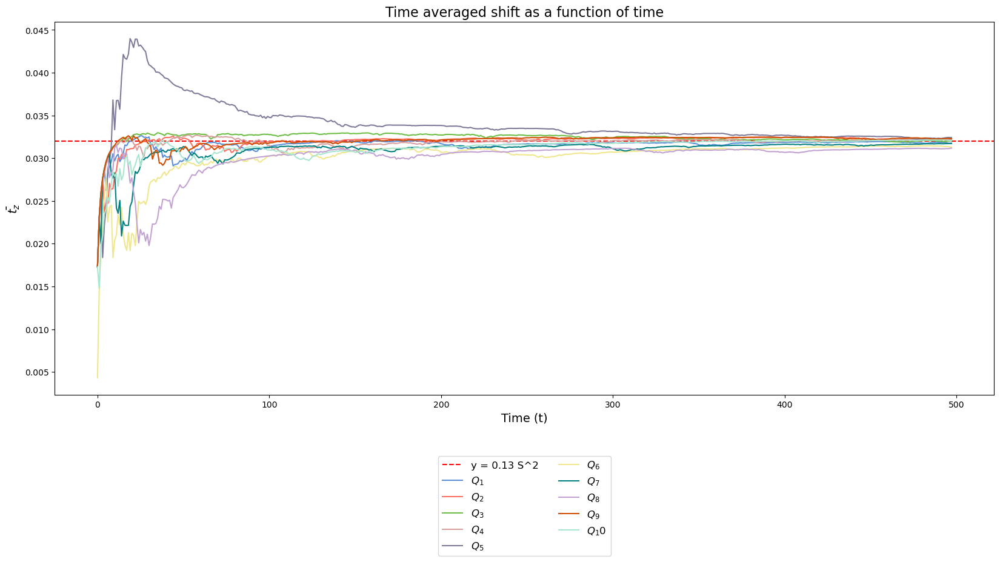

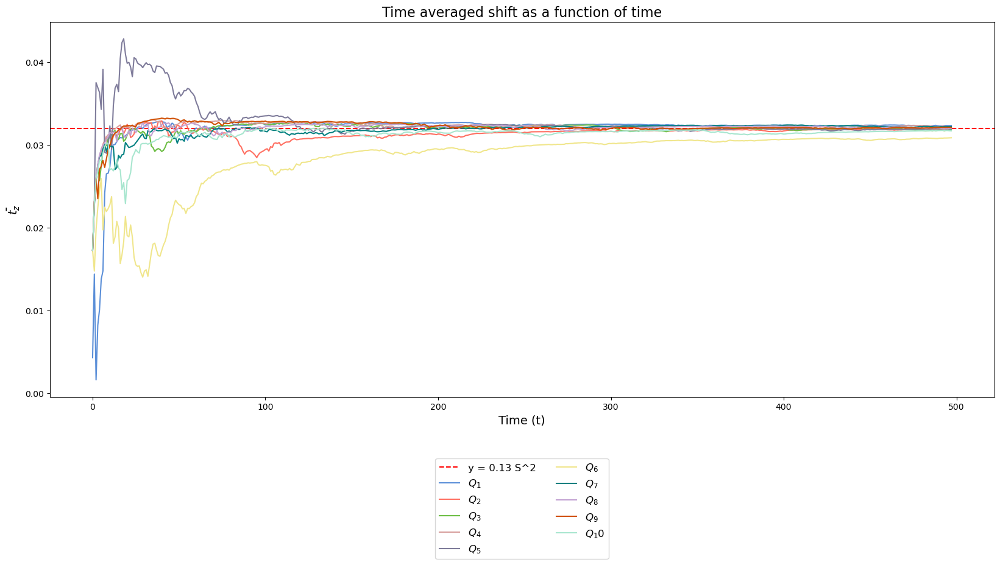

In [30]:
#time average tz for seed
size=10
seed=50
# Define a list of colors (you can choose any color names or hex codes)
#for 8Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2']
#for 10 Q
colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF']
#for 12 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C']
#for 14Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C', '#C4BEB5', '#8E7BBA']
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_random_c2,pops_random_c4,pops_random_c5,pops_random_c6,pops_random_cn]

for pops,conn in zip(datas, dataset_names):
    denom=15;
    data=time_averaged_one_point_measures_matrix_full_sim(tz_two_q_dyns_map(pops[seed],denom))
    data=np.array(data[1:499])
    
    t = np.arange(498)  # Create a list of time steps [0, 1, 2, ..., num_time_steps-1]
    import matplotlib.pyplot as plt
    import numpy as np
    
    data_transposed = data.T  # Now rows are [x1_all_times, x2_all_times, ..., xN_all_times]
    plt.figure(figsize=(20, 8))

    plt.axhline(y=(1-2*ytherm10)*(np.sin((np.pi)/denom))**2, color='r', linestyle='--', label=f'y = {ytherm10} S^2')
    
    
    # Plot each number as a function of t with specified colors
    for i, y_values in enumerate(data_transposed):
        color = colors[i % len(colors)]  # Cycle through the color list
        plt.plot(t, y_values, label=f'$Q_{i+1}$', color=color)
    
    
    # Add labels and legend
    plt.xlabel('Time (t)',fontsize=14)
    plt.ylabel('$\\bar{t_{z}}$',fontsize=14)
    plt.title('Time averaged shift as a function of time',fontsize=16)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2,fontsize=12)  # Adjust ncol for number of columns
    
    # Show the plot
    plt.savefig(f'Time averaged mean population of network {size}_q_conn_{conn}_rule_R1_seed_{seed}_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
    plt.show()

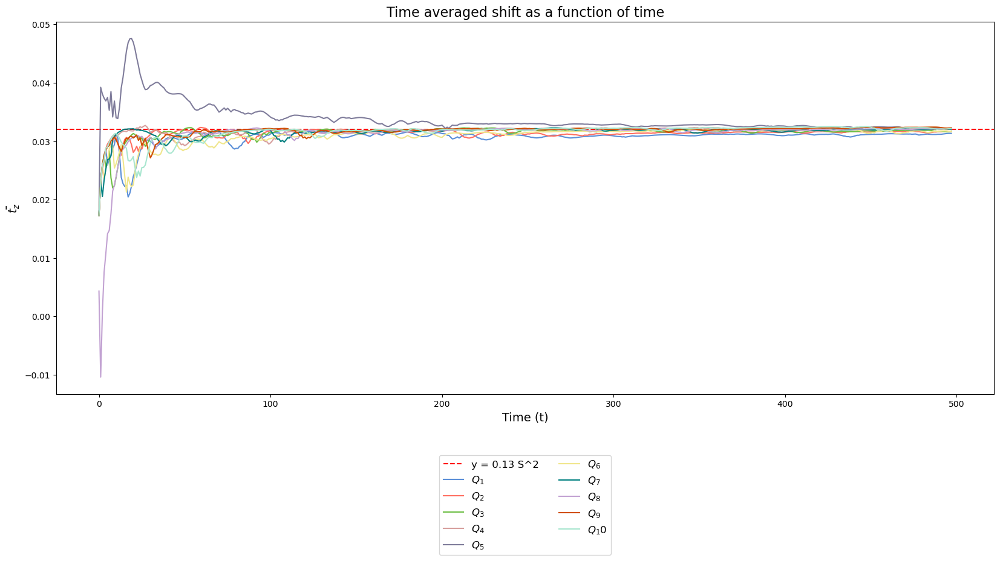

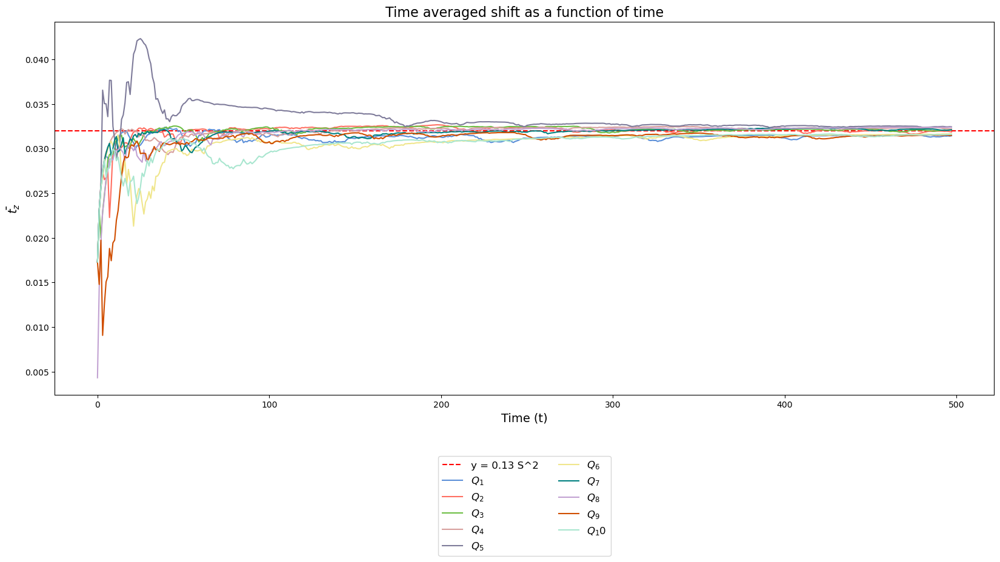

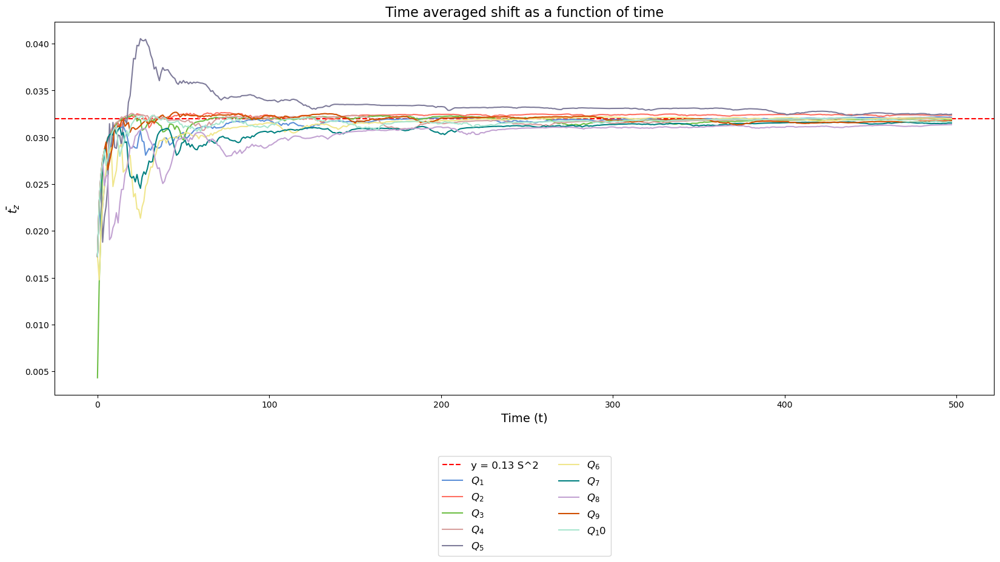

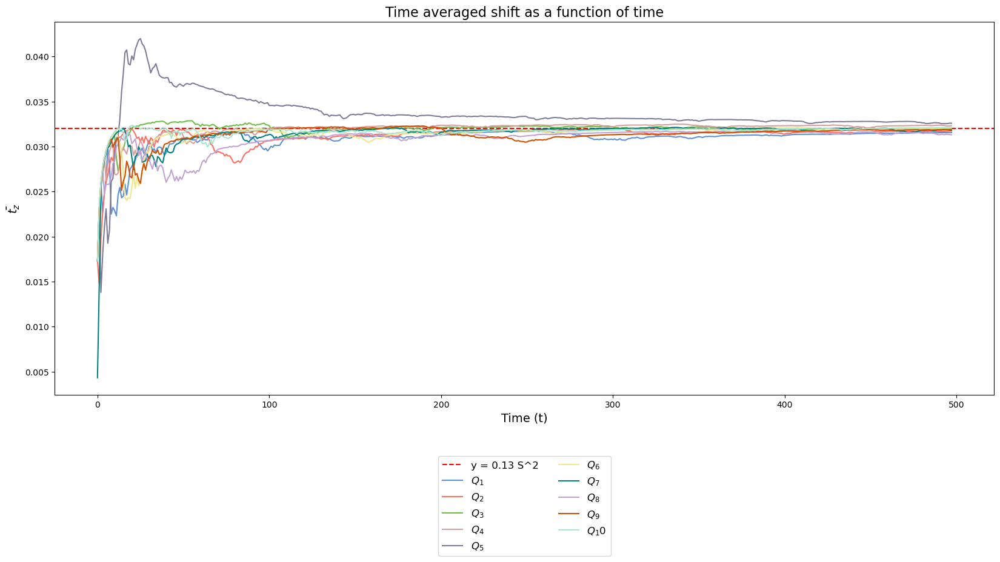

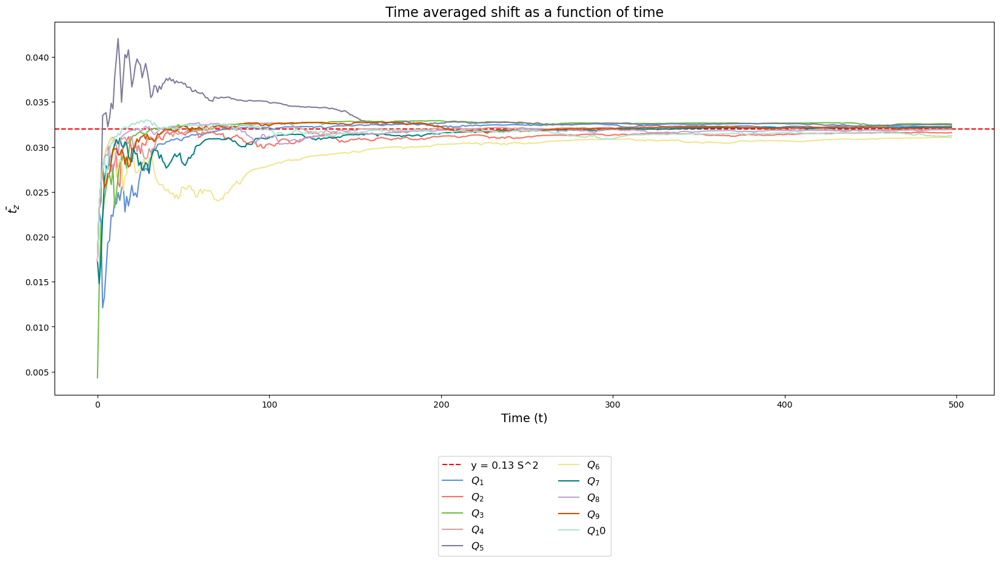

In [31]:
#size=
#seed=
# Define a list of colors (you can choose any color names or hex codes)
#for 8Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2']
#for 10 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF']
#for 12 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C']
#for 14Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C', '#C4BEB5', '#8E7BBA']
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_greedy_c2,pops_greedy_c4,pops_greedy_c5,pops_greedy_c6,pops_greedy_cn]

for pops,conn in zip(datas, dataset_names):
    denom=15;
    data=time_averaged_one_point_measures_matrix_full_sim(tz_two_q_dyns_map(pops[seed],denom))
    data=np.array(data[1:499])
    
    t = np.arange(498)  # Create a list of time steps [0, 1, 2, ..., num_time_steps-1]
    import matplotlib.pyplot as plt
    import numpy as np
    
    data_transposed = data.T  # Now rows are [x1_all_times, x2_all_times, ..., xN_all_times]
    plt.figure(figsize=(20, 8))

    plt.axhline(y=(1-2*ytherm10)*(np.sin((np.pi)/denom))**2, color='r', linestyle='--', label=f'y = {ytherm10} S^2')
    
    
    # Plot each number as a function of t with specified colors
    for i, y_values in enumerate(data_transposed):
        color = colors[i % len(colors)]  # Cycle through the color list
        plt.plot(t, y_values, label=f'$Q_{i+1}$', color=color)
    
    
    # Add labels and legend
    plt.xlabel('Time (t)',fontsize=14)
    plt.ylabel('$\\bar{t_{z}}$',fontsize=14)
    plt.title('Time averaged shift as a function of time',fontsize=16)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2,fontsize=12)  # Adjust ncol for number of columns
    
    # Show the plot
    plt.savefig(f'Time averaged mean population of network {num}q_conn_{conn}_rule_R2_seed_{seed}_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
    plt.show()


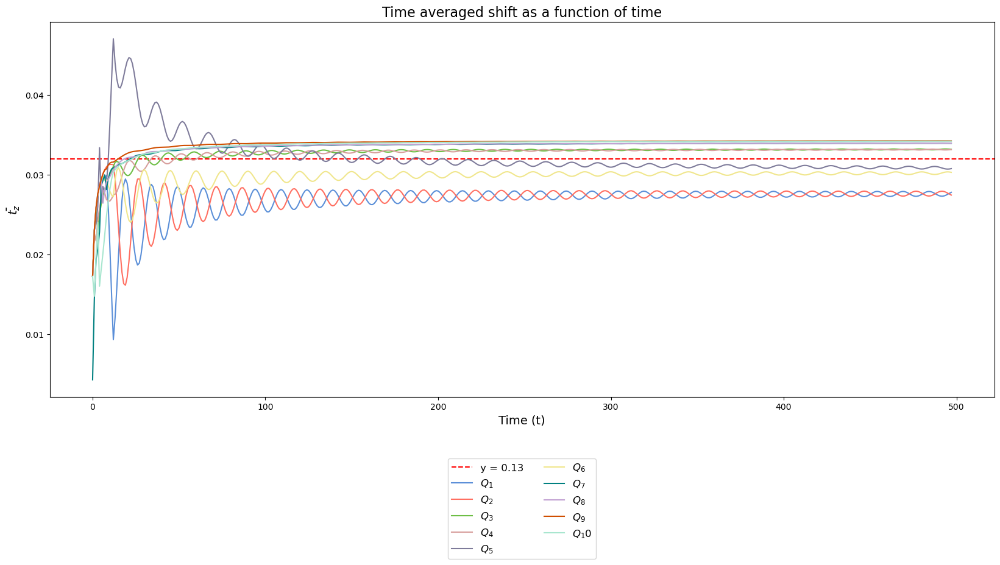

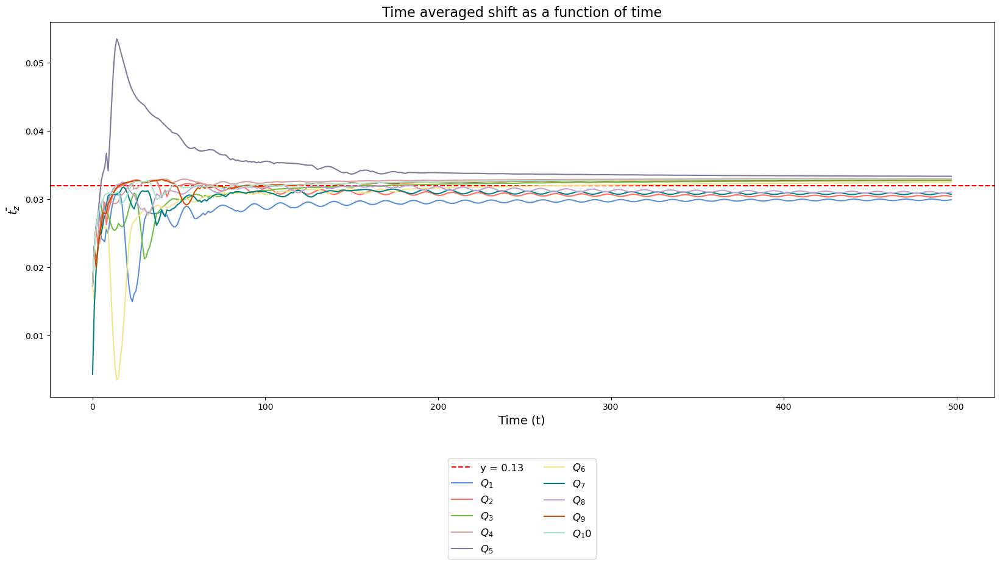

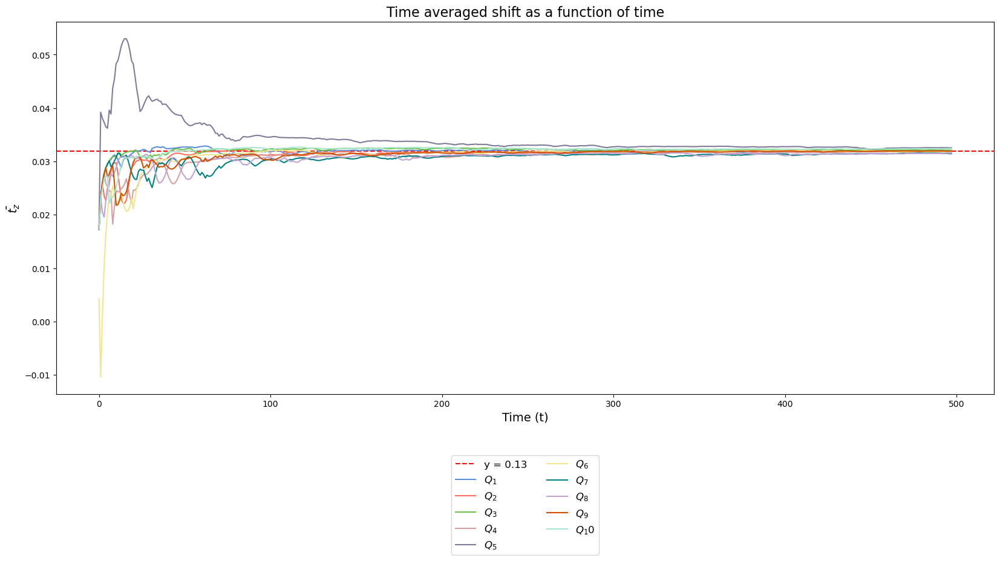

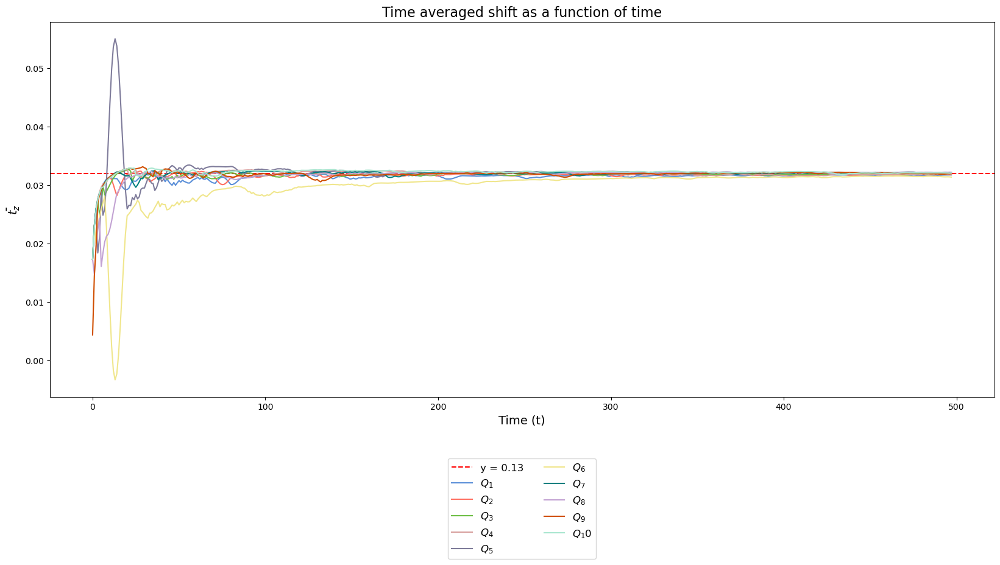

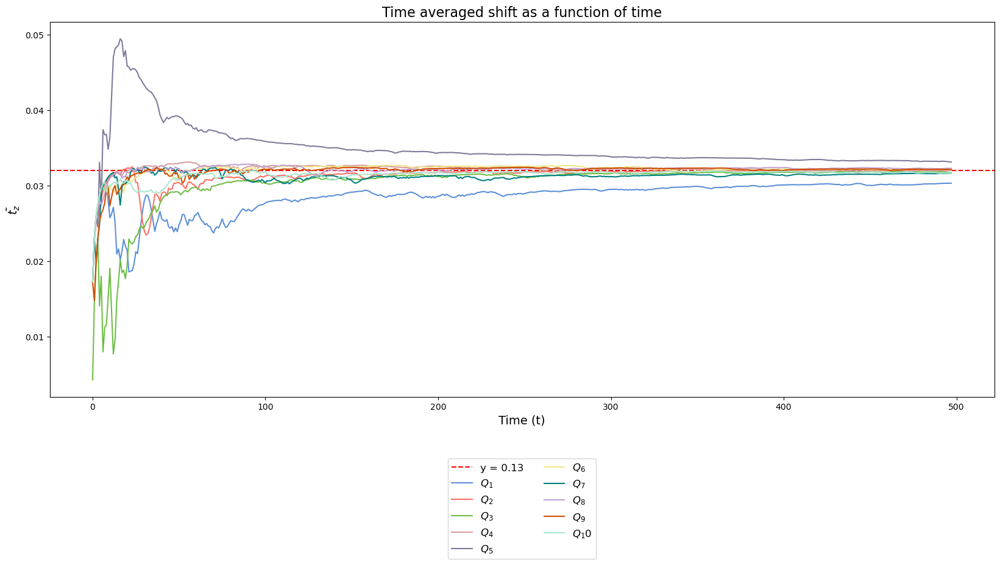

In [32]:
# Define a list of colors (you can choose any color names or hex codes)
#for 8Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2']
#for 10 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF']
#for 12 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C']
#for 14Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C', '#C4BEB5', '#8E7BBA']
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_mimic_c2,pops_mimic_c4,pops_mimic_c5,pops_mimic_c6,pops_mimic_cn]

for pops,conn in zip(datas, dataset_names):
    denom=15;
    data=time_averaged_one_point_measures_matrix_full_sim(tz_two_q_dyns_map(pops[seed],denom))
    data=np.array(data[1:499])
    
    t = np.arange(498)  # Create a list of time steps [0, 1, 2, ..., num_time_steps-1]
    import matplotlib.pyplot as plt
    import numpy as np
    
    data_transposed = data.T  # Now rows are [x1_all_times, x2_all_times, ..., xN_all_times]
    plt.figure(figsize=(20, 8))

    plt.axhline(y=(1-2*ytherm10)*(np.sin((np.pi)/15))**2, color='r', linestyle='--', label=f'y = {ytherm10}')
    
    
    # Plot each number as a function of t with specified colors
    for i, y_values in enumerate(data_transposed):
        color = colors[i % len(colors)]  # Cycle through the color list
        plt.plot(t, y_values, label=f'$Q_{i+1}$', color=color)
        
    # Add labels and legend
    plt.xlabel('Time (t)',fontsize=14)
    plt.ylabel('$\\bar{t_{z}}$',fontsize=14)
    plt.title('Time averaged shift as a function of time',fontsize=16)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2,fontsize=12)  # Adjust ncol for number of columns
    
    # Show the plot
    plt.savefig(f'Time averaged mean population of network {num}q_conn_{conn}_rule_R3_seed_{seed}_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
    plt.show()

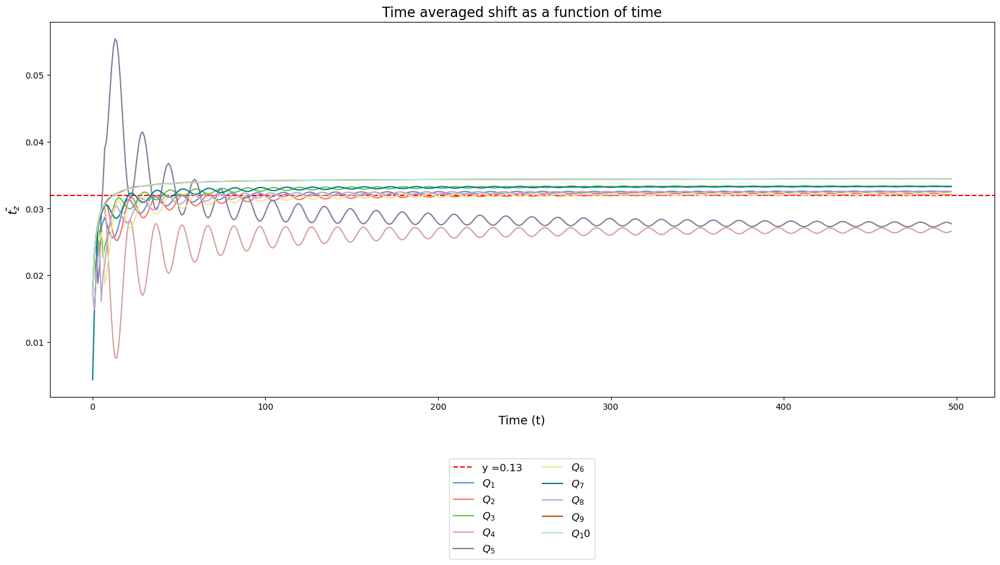

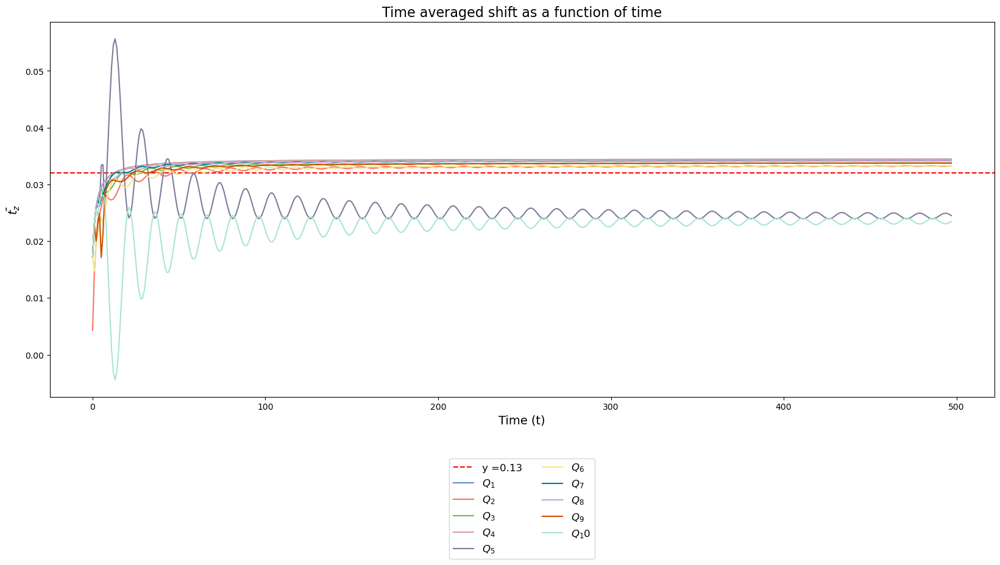

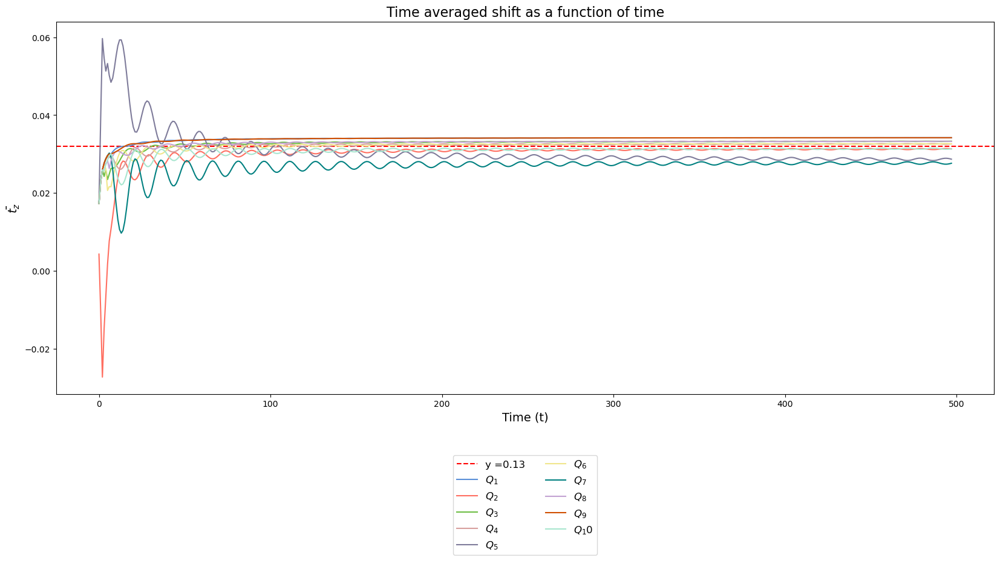

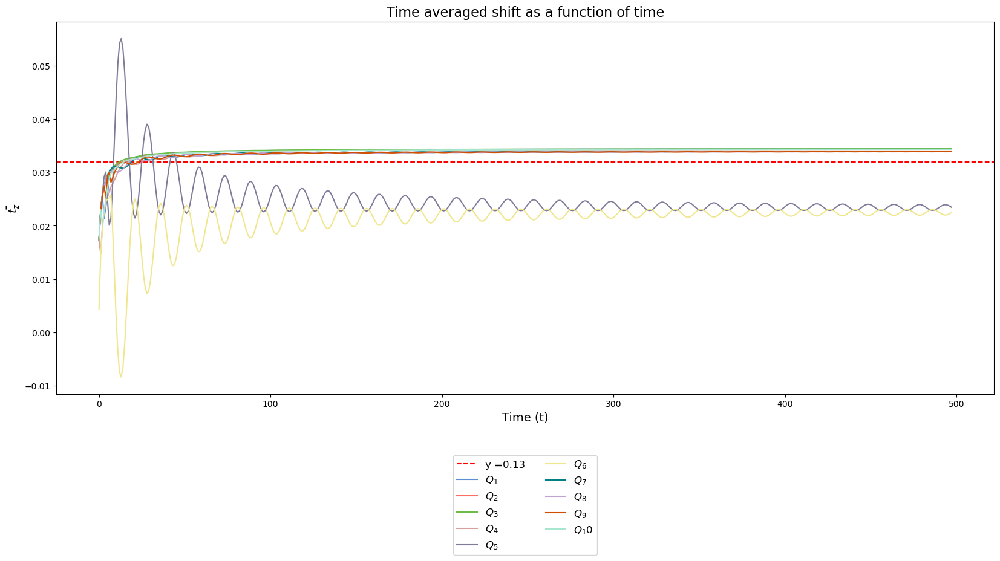

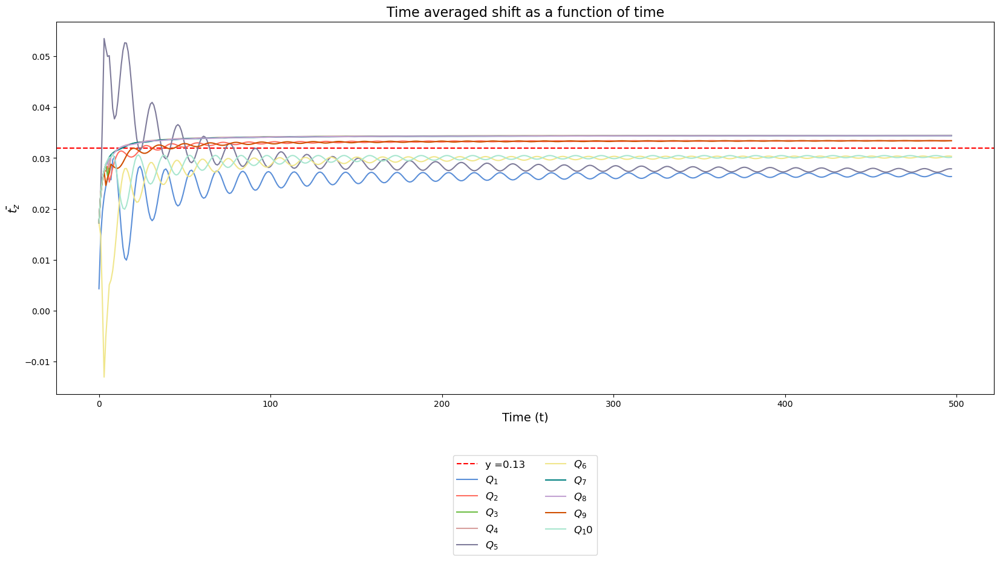

In [29]:
# Define a list of colors (you can choose any color names or hex codes)
#for 8Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2']
#for 10 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF']
#for 12 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C']
#for 14Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C', '#C4BEB5', '#8E7BBA']
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_landscape_maximizes_c2,pops_landscape_maximizes_c4,pops_landscape_maximizes_c5,pops_landscape_maximizes_c6,pops_landscape_maximizes_cn]

for pops,conn in zip(datas, dataset_names):
    denom=15;
    data=time_averaged_one_point_measures_matrix_full_sim(tz_two_q_dyns_map(pops[seed],denom))
    data=np.array(data[1:499])
    
    t = np.arange(498)  # Create a list of time steps [0, 1, 2, ..., num_time_steps-1]
    import matplotlib.pyplot as plt
    import numpy as np
    
    data_transposed = data.T  # Now rows are [x1_all_times, x2_all_times, ..., xN_all_times]
    plt.figure(figsize=(20, 8))

    plt.axhline(y=(1-2*ytherm10)*(np.sin((np.pi)/15))**2, color='r', linestyle='--', label=f'y ={ytherm10}')
    
    
    # Plot each number as a function of t with specified colors
    for i, y_values in enumerate(data_transposed):
        color = colors[i % len(colors)]  # Cycle through the color list
        plt.plot(t, y_values, label=f'$Q_{i+1}$', color=color)
        
    # Add labels and legend
    plt.xlabel('Time (t)',fontsize=14)
    plt.ylabel('$\\bar{t_{z}}$',fontsize=14)
    plt.title('Time averaged shift as a function of time',fontsize=16)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2,fontsize=12)  # Adjust ncol for number of columns
    
    # Show the plot
    plt.savefig(f'Time averaged mean population of network {num}q_conn_{conn}_rule_R4_seed_{seed}_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
    plt.show()

In [ ]:
#Ensemble average tz 

In [50]:
pops=ensemble_averaged_one_point_measures_mean_std(pops_random_c2)[0]
len(pops[0])
data=tz_two_q_dyns_map(pops,denom)
len(dat


499

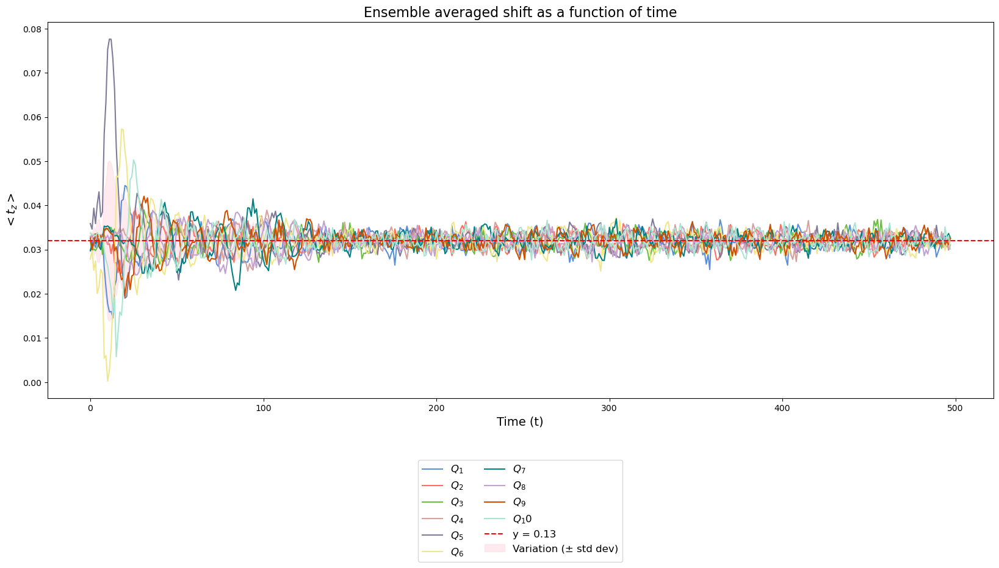

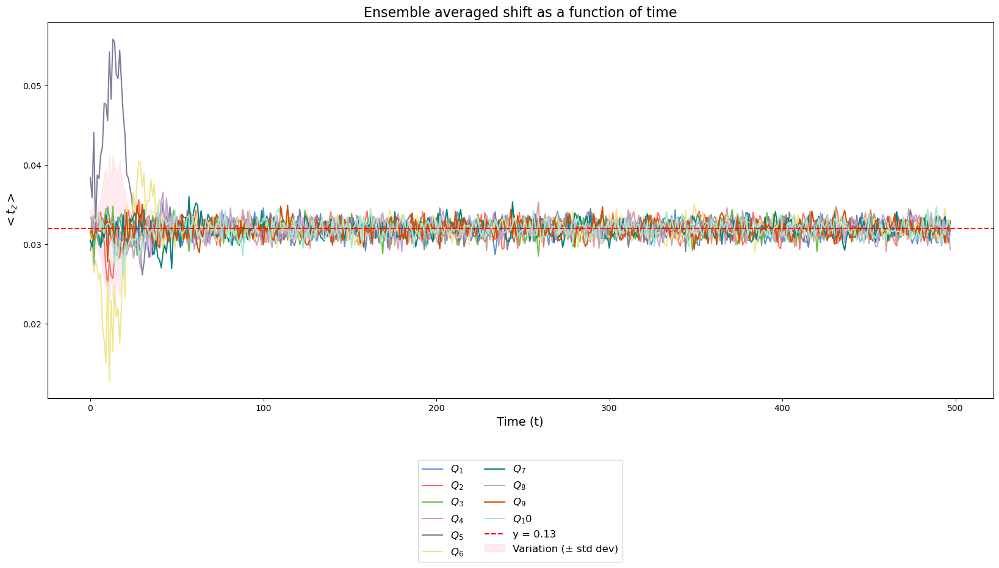

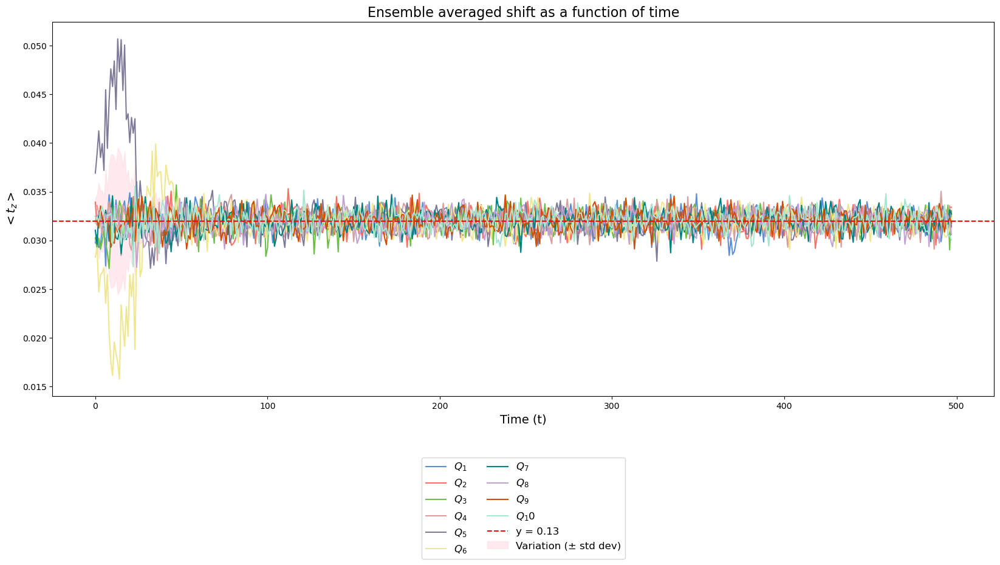

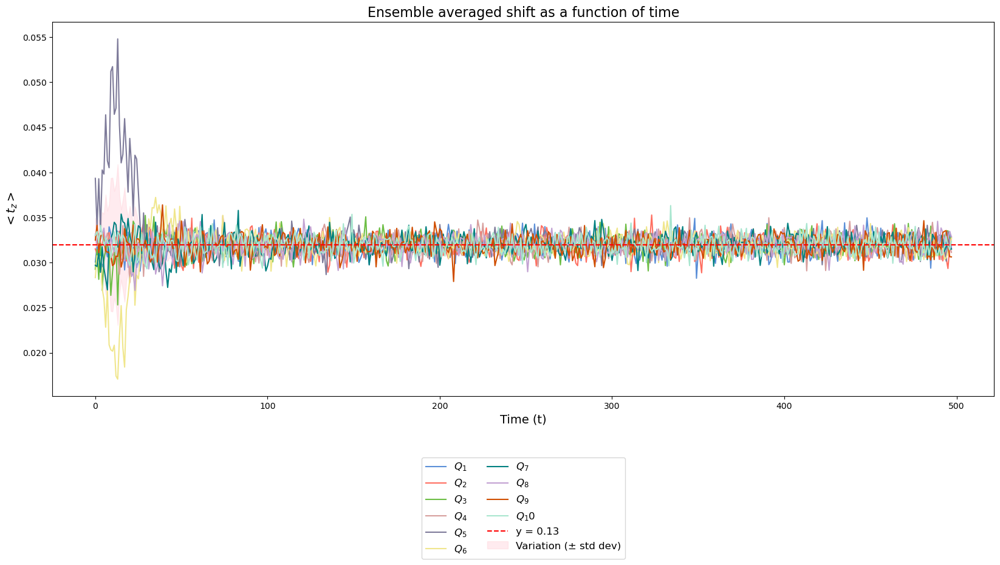

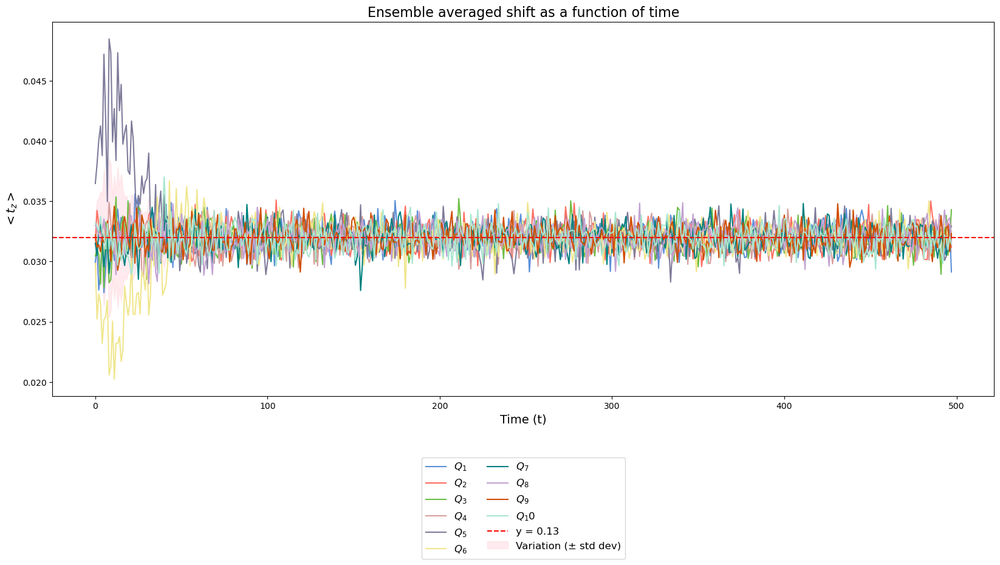

In [92]:
# Define a list of colors (you can choose any color names or hex codes)
#for 8Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2']
#for 10 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF']
#for 12 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C']
#for 14Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C', '#C4BEB5', '#8E7BBA']
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_random_c2,pops_random_c4,pops_random_c5,pops_random_c6,pops_random_cn]

for pops,conn in zip(datas, dataset_names):
    denom=15;
    ens_avg=ensemble_averaged_one_point_measures_mean_std(pops)[0]
    data=tz_two_q_dyns_map(ens_avg,denom)
    num_time_steps = len(data)-1  # The number of rows in the data corresponds to the number of time steps
    t = np.arange(num_time_steps)  # Create a list of time steps [0, 1, 2, ..., num_time_steps-1]
    
    data=np.array(data[1:499])
    data_transposed = data.T  # Now rows are [x1_all_times, x2_all_times, ..., xN_all_times]

    # Calculate the mean and standard deviation of the data at each time step
    mean_values = np.mean(data_transposed, axis=0)
    std_dev_values = np.std(data_transposed, axis=0)
    
    plt.figure(figsize=(20, 8))

    # Plot each number as a function of t with specified colors
    for i, y_values in enumerate(data_transposed):
        color = colors[i % len(colors)]  # Cycle through the color list
        plt.plot(t, y_values, label=f'$Q_{i+1}$', color=color)
    # Plot the constant line y = 0.125
    plt.axhline(y=(1-2*ytherm10)*(np.sin((np.pi)/15))**2, color='r', linestyle='--', label=f'y = {ytherm10}')
    
    # Shade the area representing the variation (standard deviation) around y = 0.125
    plt.fill_between(t,(1-2*ytherm10)*(np.sin((np.pi)/15))**2 - std_dev_values, (1-2*ytherm10)*(np.sin((np.pi)/15))**2 + std_dev_values, color='pink', alpha=0.3, label='Variation (± std dev)')
    
    # Add labels and legend
    plt.xlabel('Time (t)',fontsize=14)
    plt.ylabel('$< t_z > $',fontsize=14)
    plt.title('Ensemble averaged shift as a function of time',fontsize=16)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2,fontsize=12)  # Adjust ncol for number of columns
    
    # Show the plot
    plt.savefig(f'Ensemble averaged mean population of network {num}q_conn_{conn}_rule_R1_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
    plt.show()

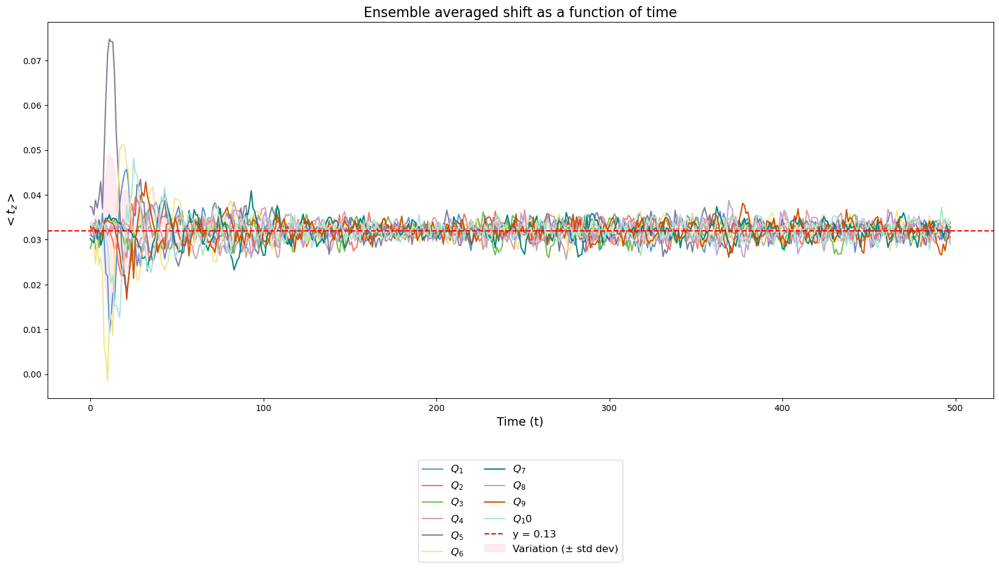

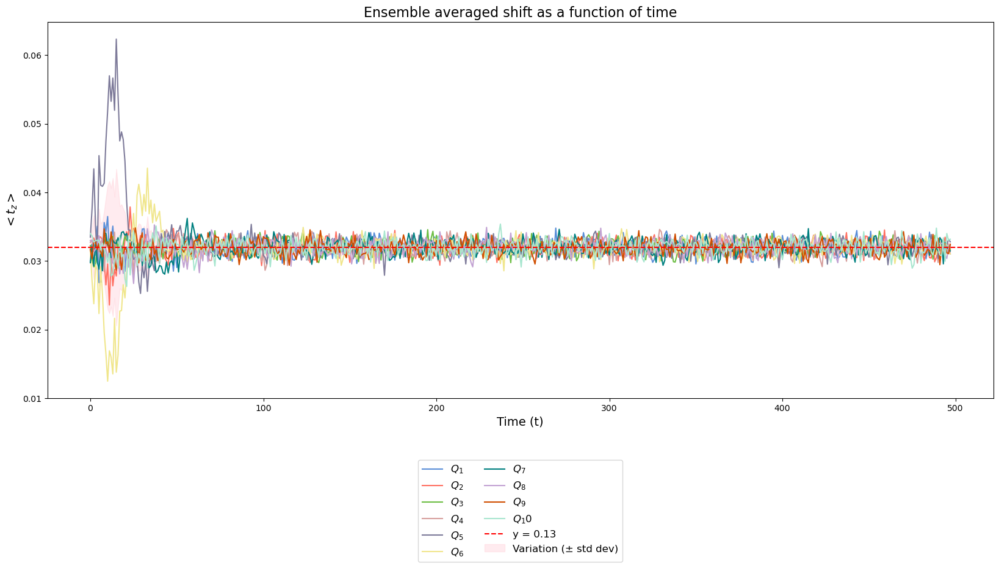

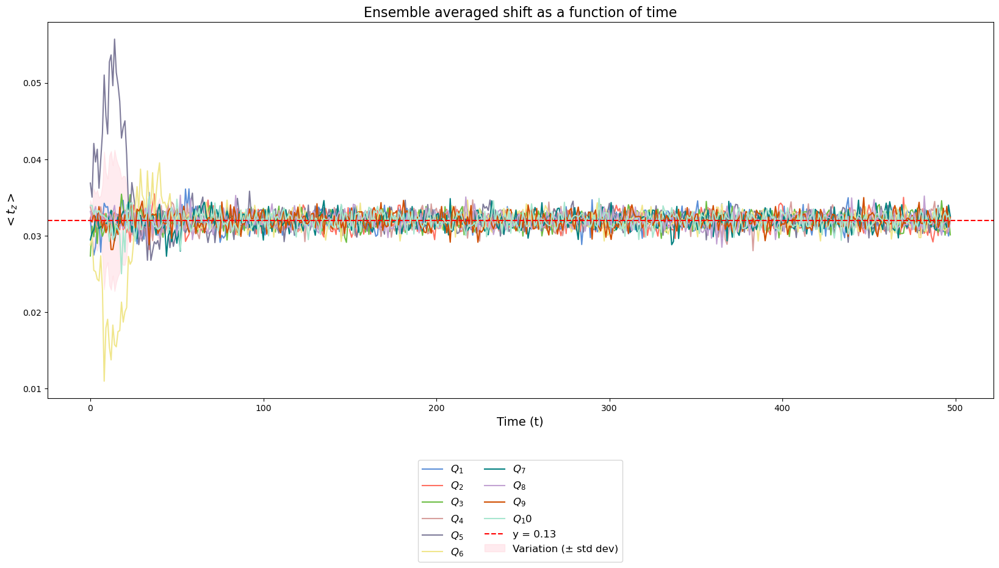

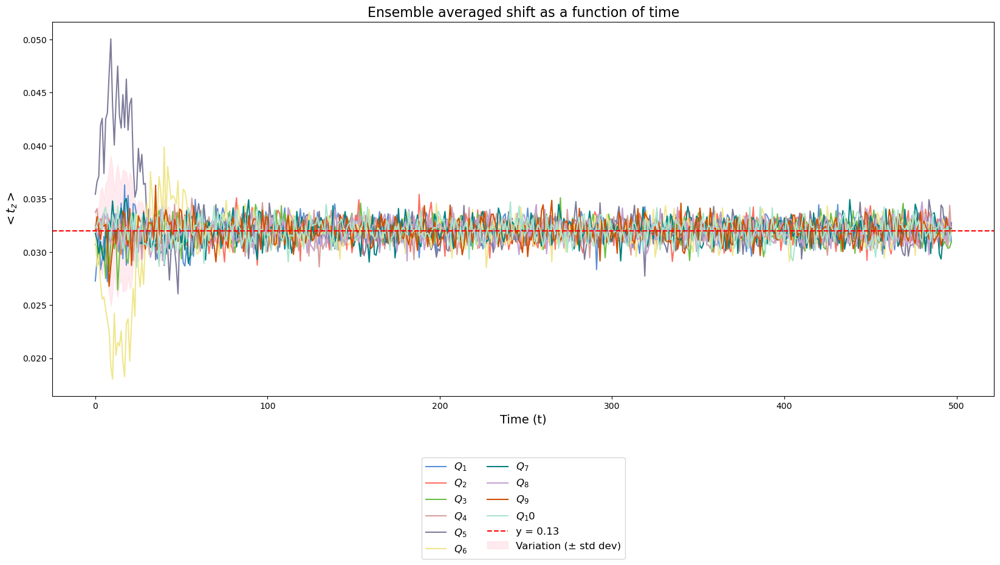

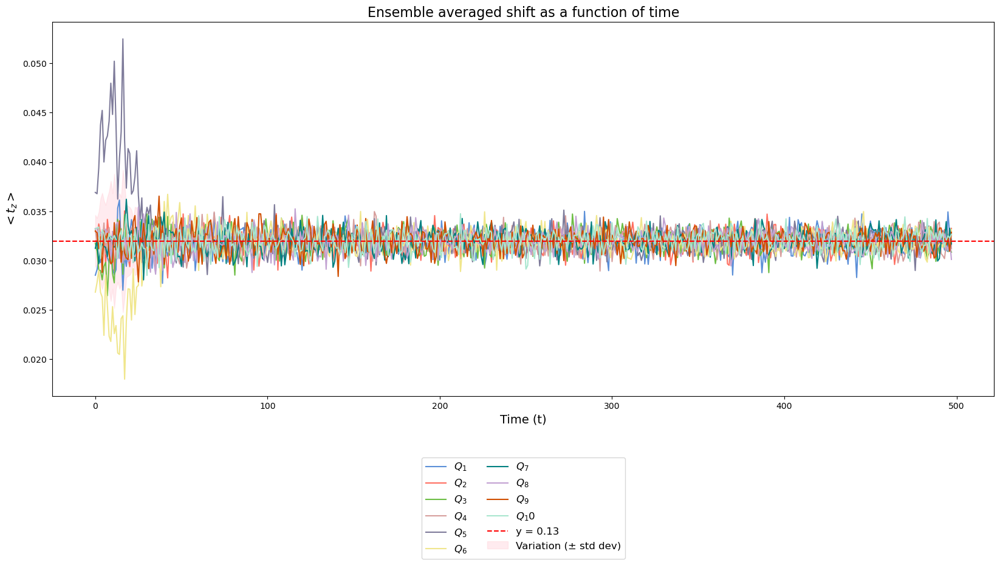

In [91]:
# Define a list of colors (you can choose any color names or hex codes)
#for 8Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2']
#for 10 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF']
#for 12 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C']
#for 14Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C', '#C4BEB5', '#8E7BBA']
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_greedy_c2,pops_greedy_c4,pops_greedy_c5,pops_greedy_c6,pops_greedy_cn]

for pops,conn in zip(datas, dataset_names):
    denom=15;
    ens_avg=ensemble_averaged_one_point_measures_mean_std(pops)[0]
    data=tz_two_q_dyns_map(ens_avg,denom)
    num_time_steps = len(data)-1  # The number of rows in the data corresponds to the number of time steps
    t = np.arange(num_time_steps)  # Create a list of time steps [0, 1, 2, ..., num_time_steps-1]
    
    data=np.array(data[1:499])
    data_transposed = data.T  # Now rows are [x1_all_times, x2_all_times, ..., xN_all_times]

    # Calculate the mean and standard deviation of the data at each time step
    mean_values = np.mean(data_transposed, axis=0)
    std_dev_values = np.std(data_transposed, axis=0)
    
    plt.figure(figsize=(20, 8))
    
    # Plot each number as a function of t with specified colors
    for i, y_values in enumerate(data_transposed):
        color = colors[i % len(colors)]  # Cycle through the color list
        plt.plot(t, y_values, label=f'$Q_{i+1}$', color=color)
    # Plot the constant line y = 0.125
    plt.axhline(y=(1-2*ytherm10)*(np.sin((np.pi)/15))**2, color='r', linestyle='--', label=f'y = {ytherm10}')
    
    # Shade the area representing the variation (standard deviation) around y = 0.125
    plt.fill_between(t,(1-2*ytherm10)*(np.sin((np.pi)/15))**2 - std_dev_values, (1-2*ytherm10)*(np.sin((np.pi)/15))**2 + std_dev_values, color='pink', alpha=0.3, label='Variation (± std dev)')
    
    # Add labels and legend
    plt.xlabel('Time (t)',fontsize=14)
    plt.ylabel('$< t_z > $',fontsize=14)
    plt.title('Ensemble averaged shift as a function of time',fontsize=16)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2,fontsize=12)  # Adjust ncol for number of columns
    
    # Show the plot
    plt.savefig(f'Ensemble averaged mean population of network {num}q_conn_{conn}_rule_R2_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
    plt.show()

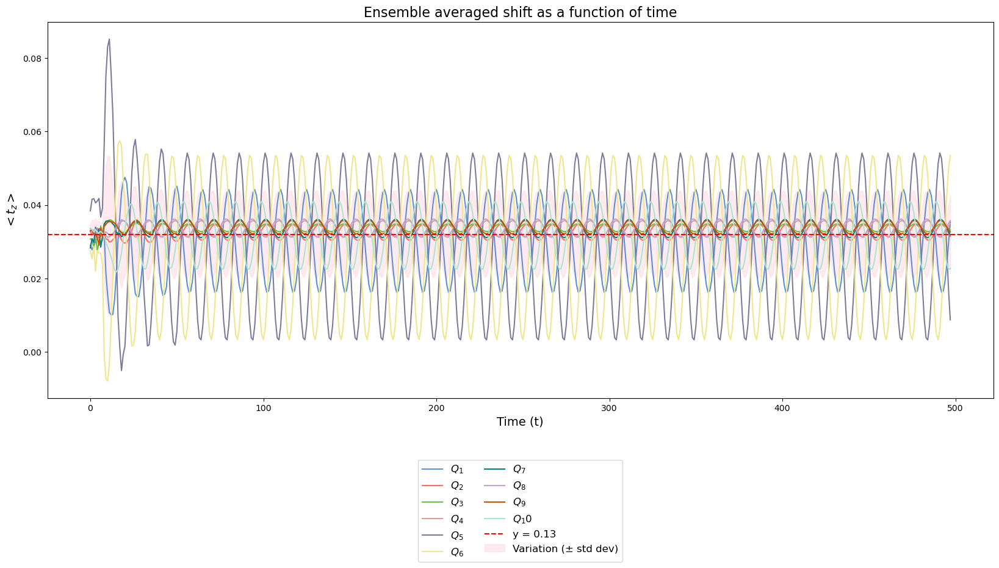

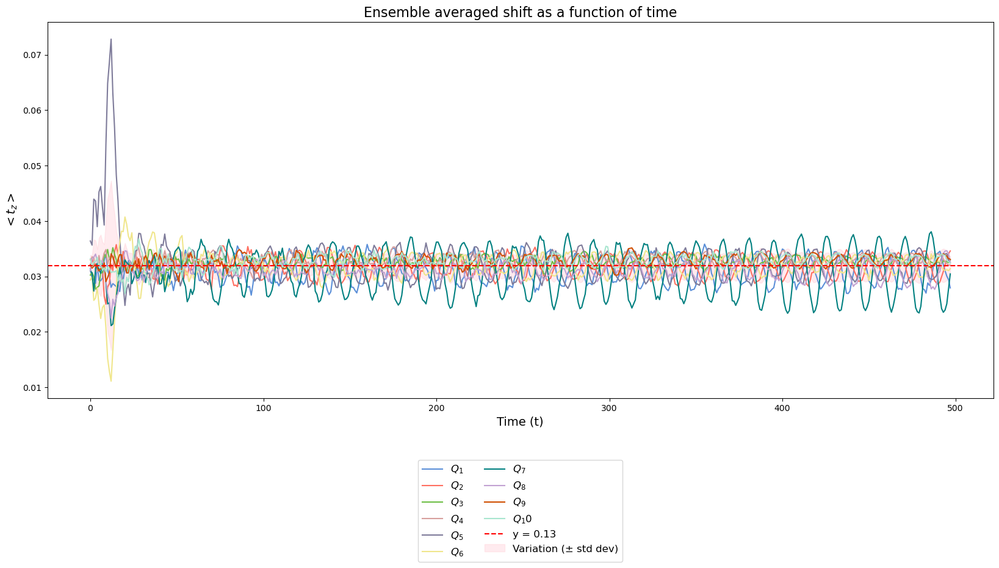

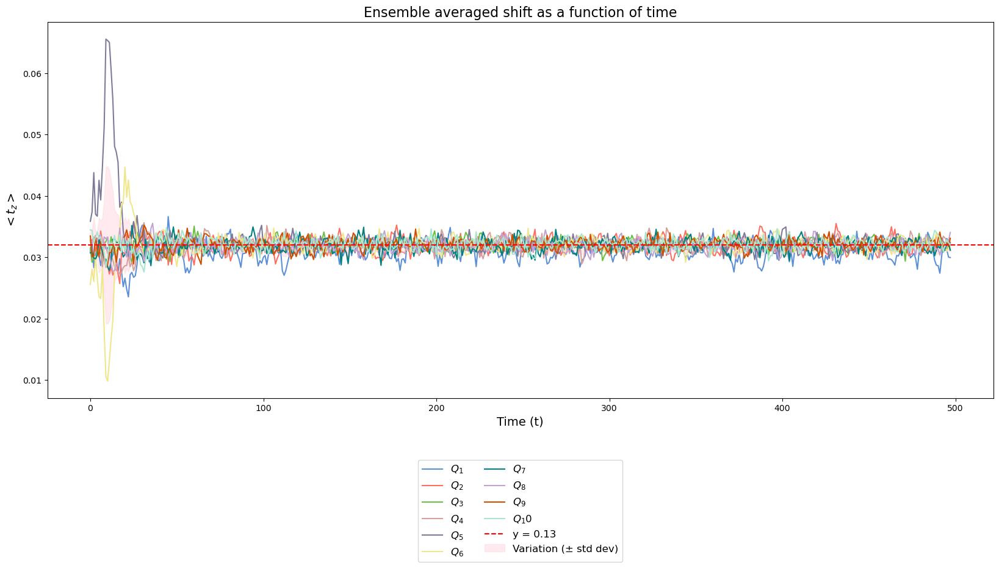

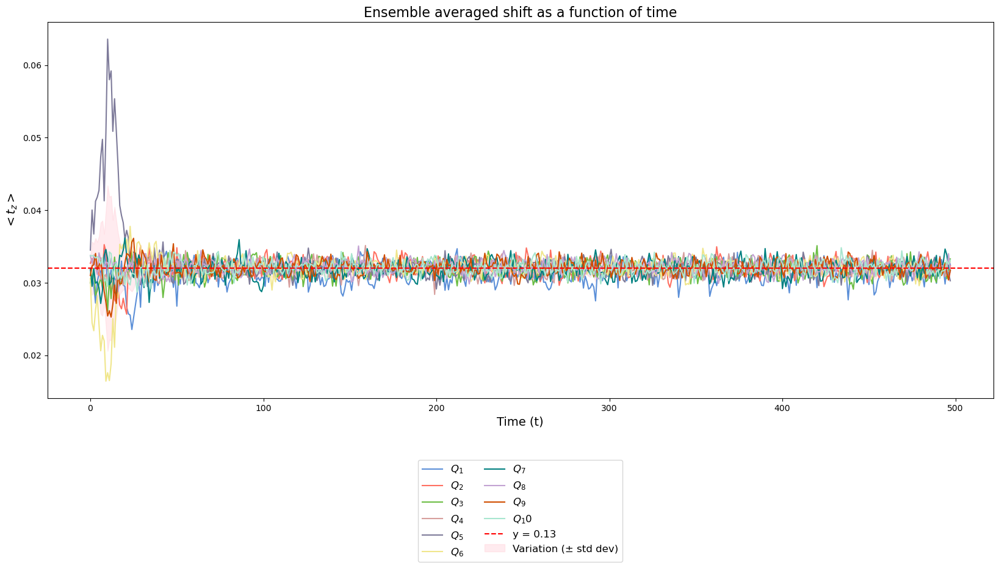

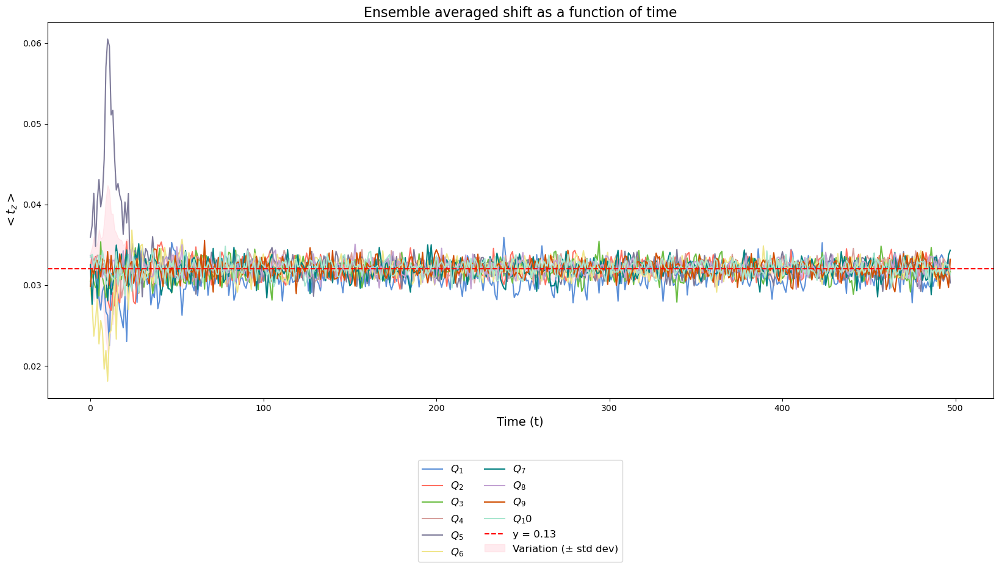

In [90]:
# Define a list of colors (you can choose any color names or hex codes)
#for 8Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2']
#for 10 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF']
#for 12 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C']
#for 14Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C', '#C4BEB5', '#8E7BBA']
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_mimic_c2,pops_mimic_c4,pops_mimic_c5,pops_mimic_c6,pops_mimic_cn]

for pops,conn in zip(datas, dataset_names):
    denom=15;
    ens_avg=ensemble_averaged_one_point_measures_mean_std(pops)[0]
    data=tz_two_q_dyns_map(ens_avg,denom)
    num_time_steps = len(data)-1  # The number of rows in the data corresponds to the number of time steps
    t = np.arange(num_time_steps)  # Create a list of time steps [0, 1, 2, ..., num_time_steps-1]
    
    data=np.array(data[1:499])
    data_transposed = data.T  # Now rows are [x1_all_times, x2_all_times, ..., xN_all_times]

    # Calculate the mean and standard deviation of the data at each time step
    mean_values = np.mean(data_transposed, axis=0)
    std_dev_values = np.std(data_transposed, axis=0)
    plt.figure(figsize=(20, 8))

    
    # Plot each number as a function of t with specified colors
    for i, y_values in enumerate(data_transposed):
        color = colors[i % len(colors)]  # Cycle through the color list
        plt.plot(t, y_values, label=f'$Q_{i+1}$', color=color)
    # Plot the constant line y = 0.125
    plt.axhline(y=(1-2*ytherm10)*(np.sin((np.pi)/15))**2, color='r', linestyle='--', label=f'y = {ytherm10}')
    
    # Shade the area representing the variation (standard deviation) around y = 0.125
    plt.fill_between(t,(1-2*ytherm10)*(np.sin((np.pi)/15))**2 - std_dev_values, (1-2*ytherm10)*(np.sin((np.pi)/15))**2 + std_dev_values, color='pink', alpha=0.3, label='Variation (± std dev)')
    
    # Add labels and legend
    plt.xlabel('Time (t)',fontsize=14)
    plt.ylabel('$ <t_z > $',fontsize=14)
    plt.title('Ensemble averaged shift as a function of time',fontsize=16)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2,fontsize=12)  # Adjust ncol for number of columns
    
    # Show the plot
    plt.savefig(f'Ensemble averaged mean population of network {num}q_conn_{conn}_rule_R3_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
    plt.show()

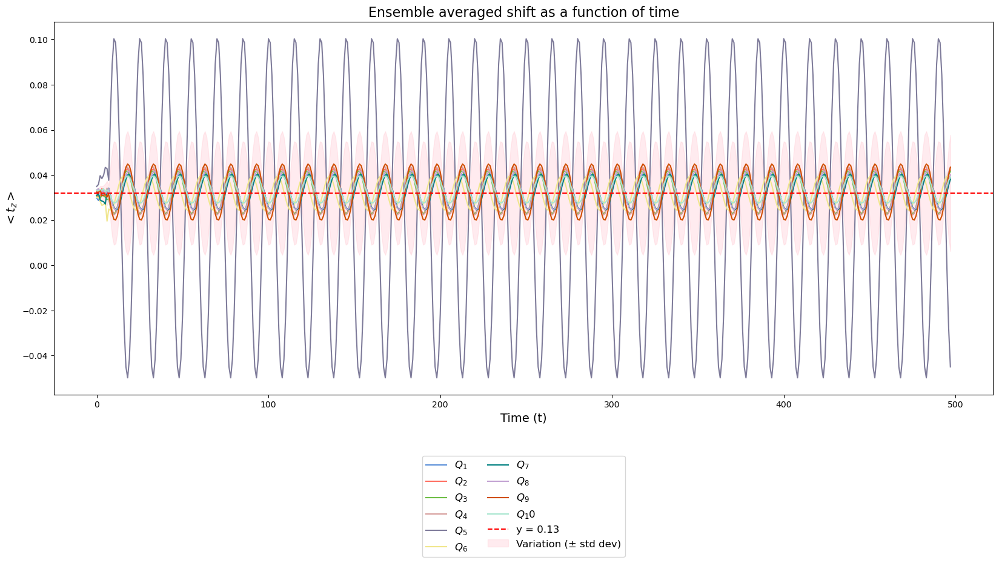

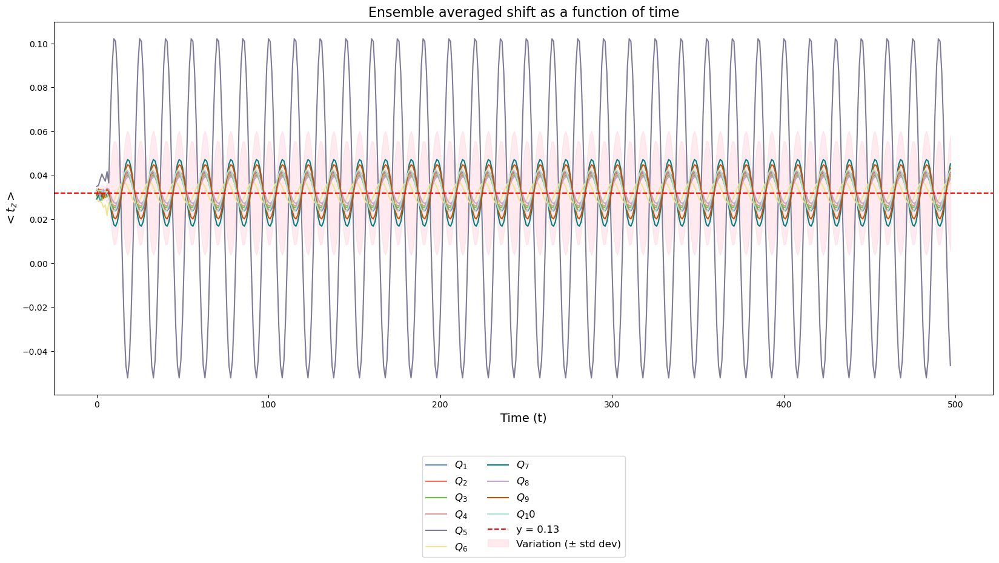

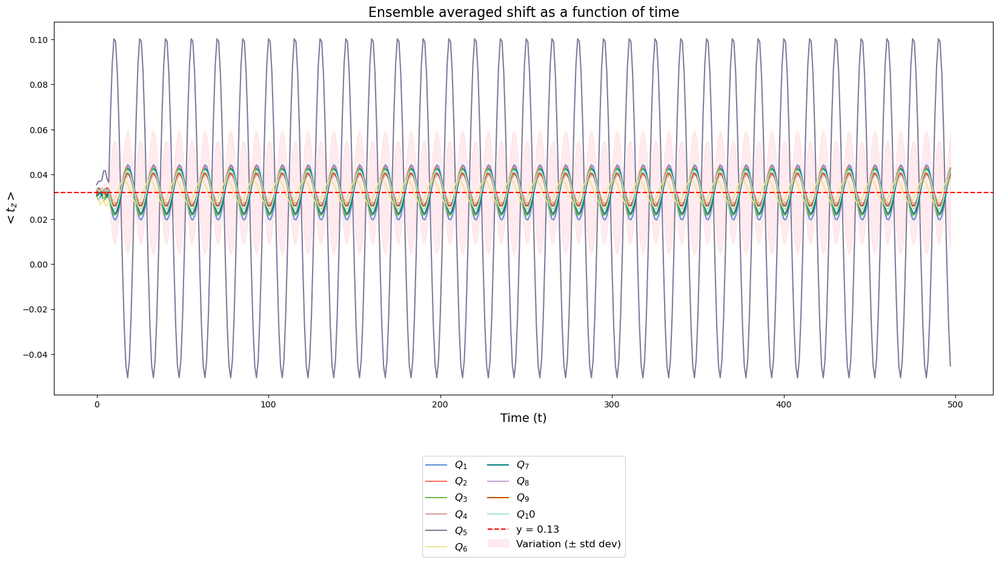

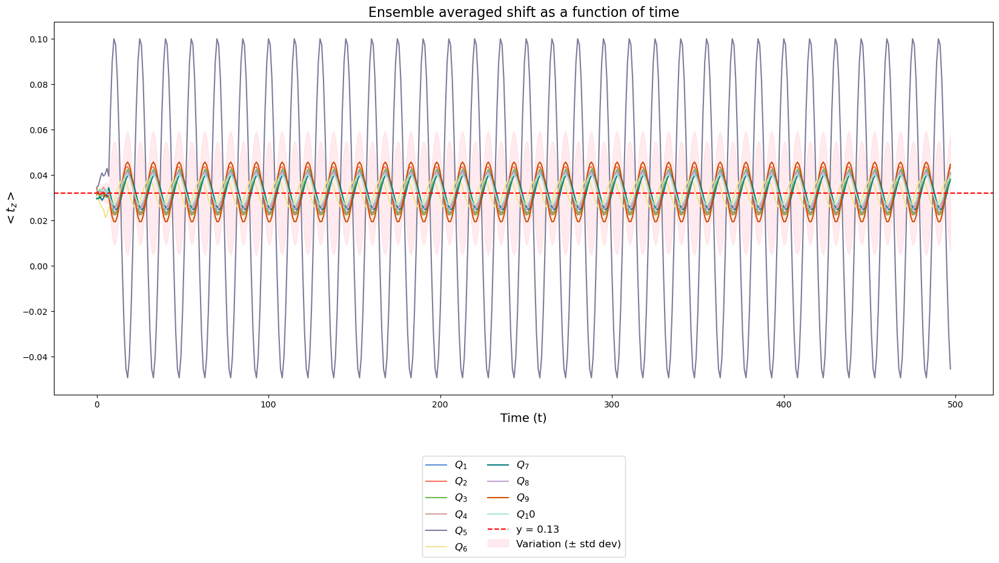

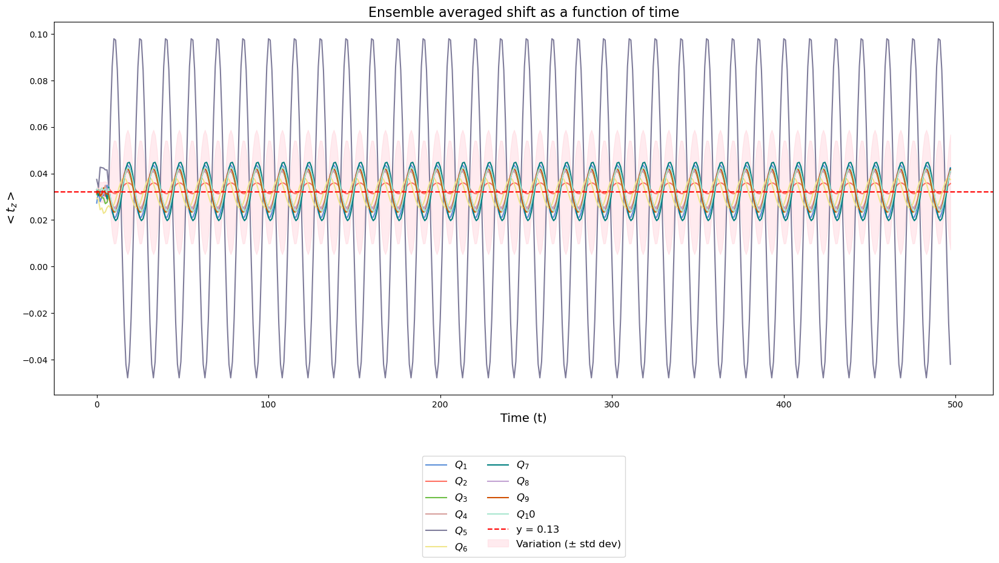

In [89]:
# Define a list of colors (you can choose any color names or hex codes)
#for 8Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2']
#for 10 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF']
#for 12 Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C']
#for 14Q
#colors = ['#5B8FD8', '#FF6F61', '#6DBE45', '#D79F9D', '#7E7B9A','#F0E68C', '#008080', '#C2A2D2', '#D04E00', '#A8E6CF','#FFDAB9', '#B2B09C', '#C4BEB5', '#8E7BBA']
dataset_names = ['c2', 'c4', 'c5', 'c6', 'cn']  # Names corresponding to each dataset
datas=[pops_landscape_maximizes_c2,pops_landscape_maximizes_c4,pops_landscape_maximizes_c5,pops_landscape_maximizes_c6,pops_landscape_maximizes_cn]

for pops,conn in zip(datas, dataset_names):
    denom=15;
    ens_avg=ensemble_averaged_one_point_measures_mean_std(pops)[0]
    data=tz_two_q_dyns_map(ens_avg,denom)
    num_time_steps = len(data)-1  # The number of rows in the data corresponds to the number of time steps
    t = np.arange(num_time_steps)  # Create a list of time steps [0, 1, 2, ..., num_time_steps-1]
    
    data=np.array(data[1:499])
    data_transposed = data.T  # Now rows are [x1_all_times, x2_all_times, ..., xN_all_times]

    # Calculate the mean and standard deviation of the data at each time step
    mean_values = np.mean(data_transposed, axis=0)
    std_dev_values = np.std(data_transposed, axis=0)
    
    plt.figure(figsize=(20, 8))

    # Plot each number as a function of t with specified colors
    for i, y_values in enumerate(data_transposed):
        color = colors[i % len(colors)]  # Cycle through the color list
        plt.plot(t, y_values, label=f'$Q_{i+1}$', color=color)
    # Plot the constant line y = 0.125
    plt.axhline(y=(1-2*ytherm10)*(np.sin((np.pi)/15))**2, color='r', linestyle='--', label=f'y = {ytherm10}')
    
    # Shade the area representing the variation (standard deviation) around y = 0.125
    plt.fill_between(t,(1-2*ytherm10)*(np.sin((np.pi)/15))**2 - std_dev_values, (1-2*ytherm10)*(np.sin((np.pi)/15))**2 + std_dev_values, color='pink', alpha=0.3, label='Variation (± std dev)')
    
    # Add labels and legend
    plt.xlabel('Time (t)',fontsize=14)
    plt.ylabel('$< t_z > $',fontsize=14)
    plt.title('Ensemble averaged shift as a function of time',fontsize=16)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2,fontsize=12)  # Adjust ncol for number of columns
    
    # Show the plot
    plt.savefig(f'Ensemble averaged mean population of network {num}q_conn_{conn}_rule_R4_{dataset_label}.pdf', format='pdf', bbox_inches='tight')
    plt.show()

In [ ]:
#not using at the moment but kept here in case we need it.
def moving_average(data, window_size=10):
    """
    Function to calculate the moving average of a given data array.
    
    Parameters:
    - data: The input data array.
    - window_size: The size of the moving average window.
    
    Returns:
    - moving_avg: The moving average array.
    """
    moving_avg = np.convolve(data, np.ones(window_size) / window_size, mode='valid')
    return moving_avg

def plot_four_stats_as_function_of_time(list1, list2, list3,list4, filename='plot.png',title='plotname'):
    # Assuming both lists have the same length (representing time steps)
    time_steps = range(1, len(list1) + 1)
    
    # Calculate moving averages for both lists
    moving_avg_list1 = moving_average(list1)
    moving_avg_list2 = moving_average(list2)
    moving_avg_list3 = moving_average(list3)
    moving_avg_list4 = moving_average(list4)
    
    # Set the figure size (adjust as needed)
    plt.figure(figsize=(15, 6))  # Width: 10 inches, Height: 6 inches
    
    # Plotting the lists and their moving averages
    plt.plot(time_steps, list1, color='blue', label='Random')
    plt.plot(time_steps, list2,color='orange', label='Greedy')
    plt.plot(time_steps, list3, color='red',label='Mimic')
    plt.plot(time_steps, list4, color='green',label='Landmax')
    plt.plot(time_steps[len(list1) - len(moving_avg_list1):], moving_avg_list1, linestyle='--', color='blue', label='Moving Average (Random)')
    plt.plot(time_steps[len(list2) - len(moving_avg_list2):], moving_avg_list2, linestyle='--', color='orange', label='Moving Average (Greedy)')
    plt.plot(time_steps[len(list3) - len(moving_avg_list3):], moving_avg_list3, linestyle='--', color='red', label='Moving Average (Mimic)')
    plt.plot(time_steps[len(list4) - len(moving_avg_list4):], moving_avg_list4, linestyle='--', color='green', label='Moving Average (Landmax)')    
    
    # Adding labels and title
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.title(title)
    
    # Adding legend
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=2)
    
    # Display the plot
    plt.grid(True)
    
    # Save the plot with the desired filename
    #plt.savefig(filename)
    
    # Show the plot (optional)
    plt.show()

def plot_four_stats_as_function_of_time_avg(list1, list2, list3,list4, filename='plot.png',title='plotname'):
    # Assuming both lists have the same length (representing time steps)
    time_steps = range(1, len(list1) + 1)
    
    # Calculate moving averages for both lists
    moving_avg_list1 = moving_average(list1)
    moving_avg_list2 = moving_average(list2)
    moving_avg_list3 = moving_average(list3)
    moving_avg_list4 = moving_average(list4)
    
    # Set the figure size (adjust as needed)
    plt.figure(figsize=(15, 6))  # Width: 10 inches, Height: 6 inches
    
    # Plotting the lists and their moving averages
    #plt.plot(time_steps, list1, color='blue', label='Random')
#    plt.plot(time_steps, list2,color='orange', label='Greedy')
    #plt.plot(time_steps, list3, color='green',label='Land_max')
    #plt.plot(time_steps, list4, color='red',label='Mimic')
    plt.plot(time_steps[len(list1) - len(moving_avg_list1):], moving_avg_list1, linestyle='--', color='blue', label='Moving Average (Random)')
    plt.plot(time_steps[len(list2) - len(moving_avg_list2):], moving_avg_list2, linestyle='--', color='orange', label='Moving Average (Greedy)')
    plt.plot(time_steps[len(list3) - len(moving_avg_list3):], moving_avg_list3, linestyle='--', color='red', label='Moving Average (Mimic)')
    plt.plot(time_steps[len(list4) - len(moving_avg_list4):], moving_avg_list4, linestyle='--', color='green', label='Moving Average (Landmax)')    
    
    # Adding labels and title
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.title(title)
    
    # Adding legend
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=2)
    
    # Display the plot
    plt.grid(True)
    
    # Save the plot with the desired filename
   # plt.savefig(filename)
    
    # Show the plot (optional)
    plt.show()